#Loading the Datasets

In [0]:
#Importing needed libraries
import pandas as pd

In [0]:
#Downloading and loading train dataset
data = pd.read_csv('https://s3.amazonaws.com/drivendata-prod/data/66/public/training_set_features.csv')
data.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb


In [0]:
#Shape of the dataset
data.shape

(26707, 36)

#Exploratory Data Analysis

In [0]:
#Checking values within columns
data['hhs_geo_region'].unique()

array(['oxchjgsf', 'bhuqouqj', 'qufhixun', 'lrircsnp', 'atmpeygn',
       'lzgpxyit', 'fpwskwrf', 'mlyzmhmf', 'dqpwygqj', 'kbazzjca'],
      dtype=object)

The regions represent the US Dept Health and Human Services defined areas that each HHS office looks after. A region has between 3-6 states within them. Info can be found here - https://www.hhs.gov/about/agencies/iea/regional-offices/index.html

In [0]:
#Separating categorical variables for plotting
categorical_variables = ['age_group','education','race','sex','income_poverty','marital_status','rent_or_own','employment_status','hhs_geo_region','census_msa','employment_industry','employment_occupation']

In [0]:
#Function for plotting barplots
import seaborn as sns
import matplotlib.pyplot as plt

def plot_bar_chart_for_column(col):
    """
    This function plots a bar chart for a categorical feature.
    :param col: String the column name to plot a bar chart for
    """
    count = data[col].value_counts()
    print("# of categories", len(count))
    fig, ax = plt.subplots(figsize=(10, 5))
    plt.xticks(rotation=90)
    plt.title(col)
    sns.barplot(x=count.index, y=count.values, ax=ax)
    plt.show()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# of categories 5


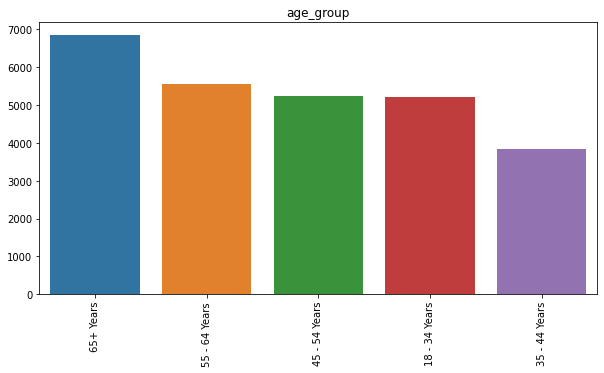

# of categories 4


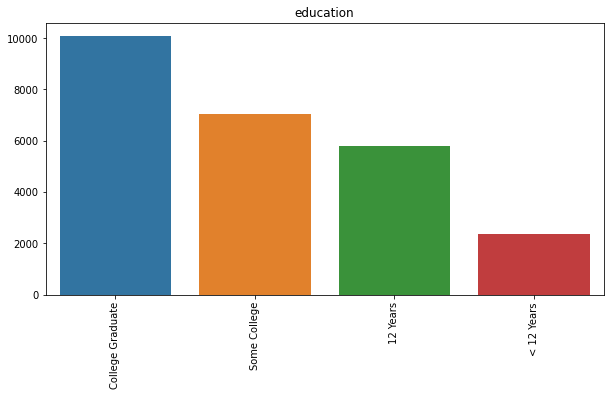

# of categories 4


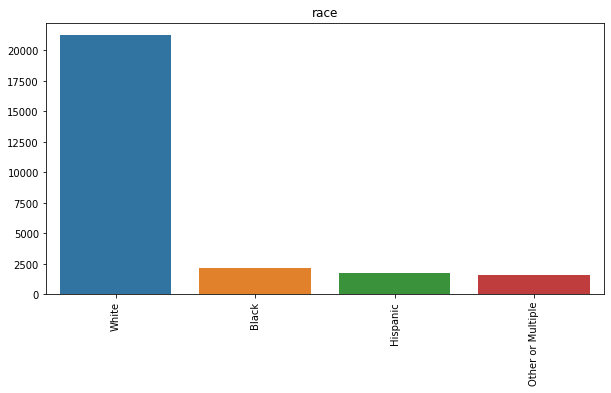

# of categories 2


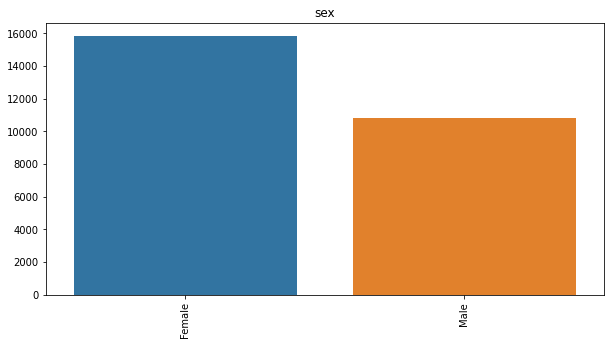

# of categories 3


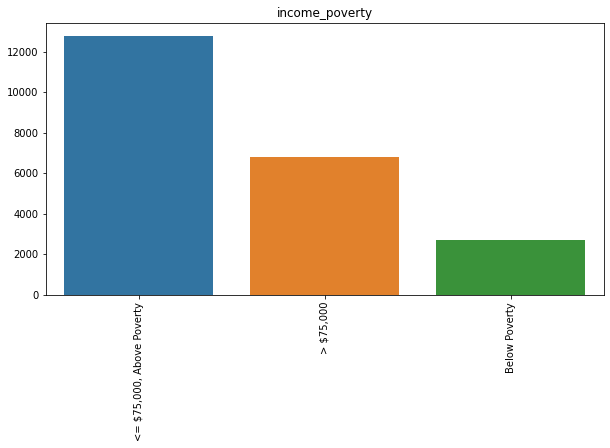

# of categories 2


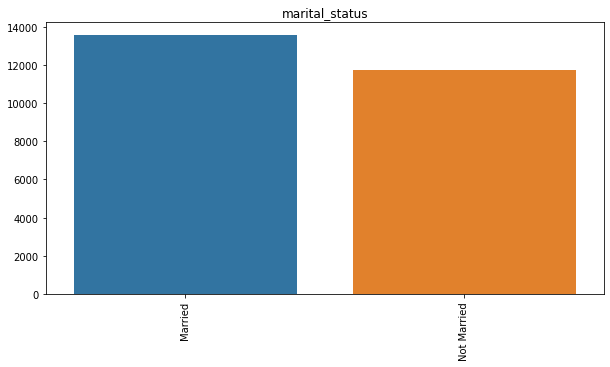

# of categories 2


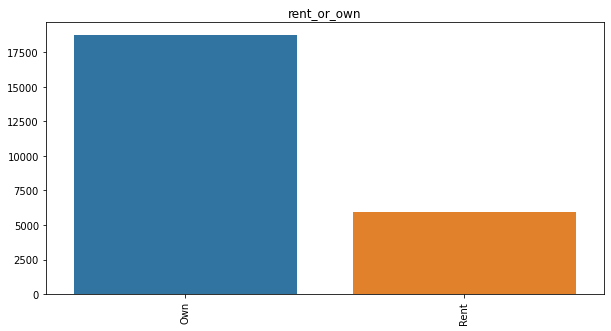

# of categories 3


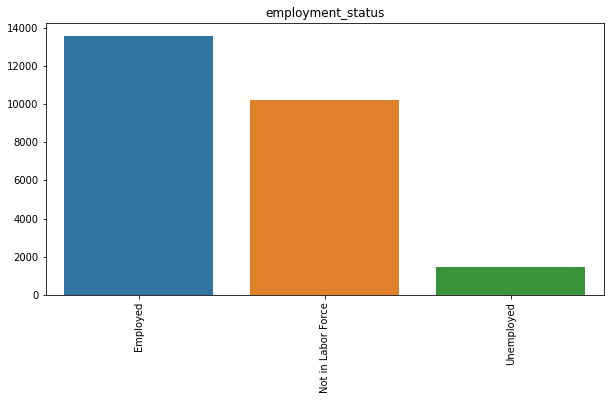

# of categories 10


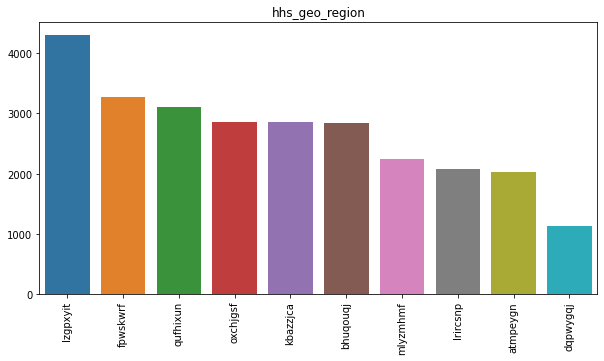

# of categories 3


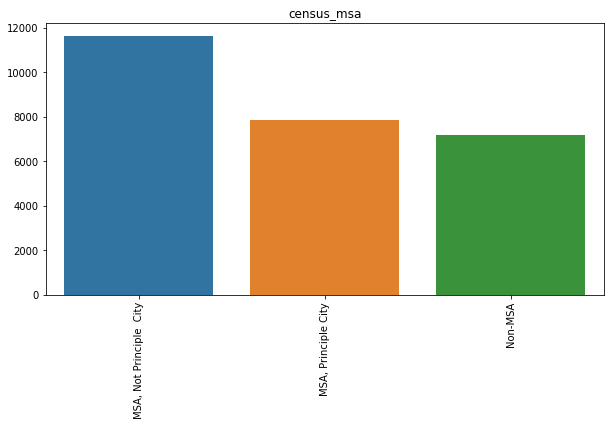

# of categories 21


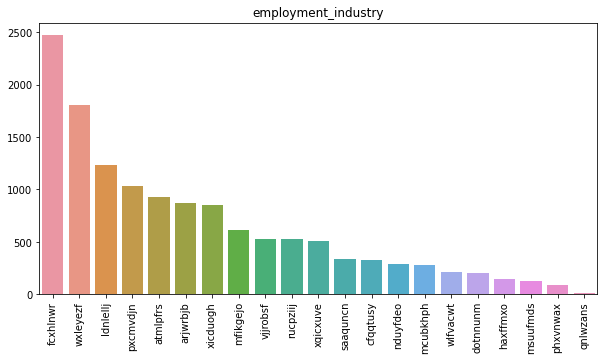

# of categories 23


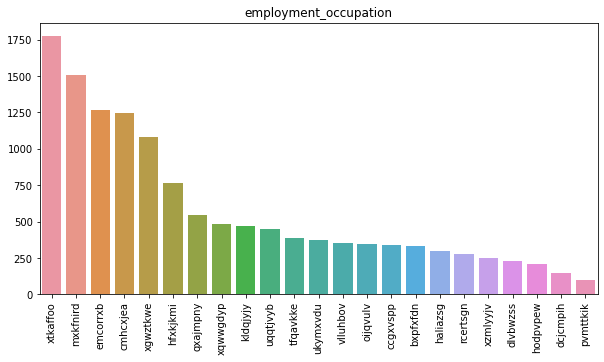

In [0]:
#Plotting categorical variables
for var in categorical_variables:
  plot_bar_chart_for_column(var)

In [0]:
#Function for stacked-cross-tabs plotting
def plot_cross_tab_chart(col1,col2):
  cross_tab = pd.crosstab(index=data[col1], columns=data[col2])
  cross_tab.plot(kind="bar", figsize=(8,8),stacked=True)

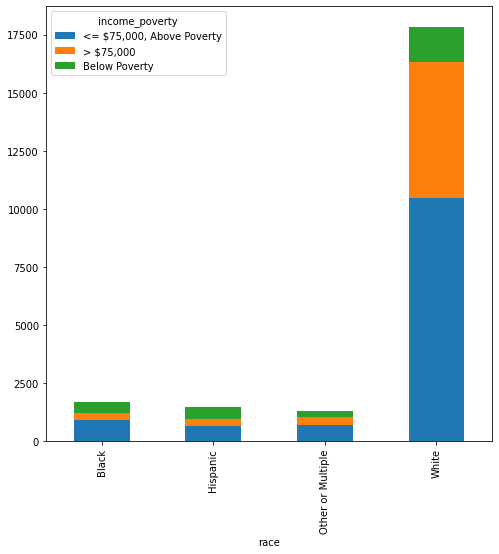

In [0]:
#Plotting categorical variables together
plot_cross_tab_chart('race','income_poverty')

In [0]:
#Splitting the dataset as per race since White is dominant
data_white = data[data['race']=='White']
data_others = data[data['race']!='White']
data_white.shape

(21222, 36)

In [0]:
#Downloading and loading the train labels - multi-class output
trainY = pd.read_csv('https://s3.amazonaws.com/drivendata-prod/data/66/public/training_set_labels.csv')
trainY.head()

,respondent_id,h1n1_vaccine,seasonal_vaccine
0,0,0,0
1,1,0,1
2,2,0,0
3,3,0,1
4,4,0,0


In [0]:
data

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg


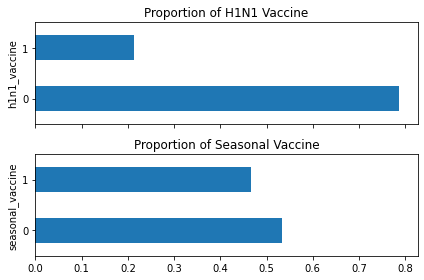

In [0]:
#Looking at the proportions of train labels for each vaccine
fig, ax = plt.subplots(2, 1, sharex=True)

n_obs = trainY.shape[0]

(trainY['h1n1_vaccine']
    .value_counts()
    .div(n_obs)
    .plot.barh(title="Proportion of H1N1 Vaccine", ax=ax[0])
)
ax[0].set_ylabel("h1n1_vaccine")

(trainY['seasonal_vaccine']
    .value_counts()
    .div(n_obs)
    .plot.barh(title="Proportion of Seasonal Vaccine", ax=ax[1])
)
ax[1].set_ylabel("seasonal_vaccine")

fig.tight_layout()

In [0]:
#Finding if taking up of the two vaccines is correlated or not
trainY.corr()

,respondent_id,h1n1_vaccine,seasonal_vaccine
respondent_id,1.000000,-0.003280,-0.004652
h1n1_vaccine,-0.003280,1.000000,0.377143
seasonal_vaccine,-0.004652,0.377143,1.000000


In [0]:
#Combining the train features and labels to visualise vaccine take-up proportions as per features
joined_df = data.join(trainY, on= data['respondent_id'],how='left',rsuffix='x_')
joined_df = joined_df.drop(columns='respondent_idx_')
print(joined_df.shape)
joined_df.head()

(26707, 38)


,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [0]:
#Function for plotting the labels with features
def vaccination_rate_plot(col, target, data, ax=None):
    """Stacked bar chart of vaccination rate for `target` against 
    `col`. 
    
    Args:
        col (string): column name of feature variable
        target (string): column name of target variable
        data (pandas DataFrame): dataframe that contains columns 
            `col` and `target`
        ax (matplotlib axes object, optional): matplotlib axes 
            object to attach plot to
    """
    counts = (joined_df[[target, col]]
                  .groupby([target, col])
                  .size()
                  .unstack(target)
             )
    group_counts = counts.sum(axis='columns')
    props = counts.div(group_counts, axis='index')

    props.plot(kind="barh", stacked=True, ax=ax)
    ax.invert_yaxis()
    ax.legend().remove()

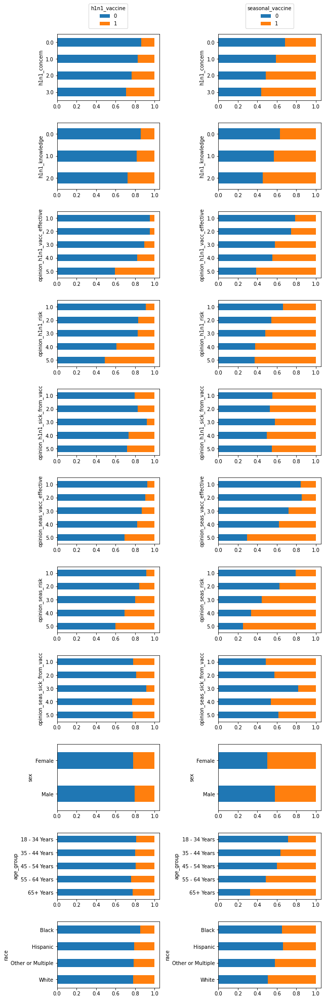

In [0]:
#Plotting
cols_to_plot = [
    'h1n1_concern',
    'h1n1_knowledge',
    'opinion_h1n1_vacc_effective',
    'opinion_h1n1_risk',
    'opinion_h1n1_sick_from_vacc',
    'opinion_seas_vacc_effective',
    'opinion_seas_risk',
    'opinion_seas_sick_from_vacc',
    'sex',
    'age_group',
    'race',
]

fig, ax = plt.subplots(
    len(cols_to_plot), 2, figsize=(9,len(cols_to_plot)*2.5)
)
for idx, col in enumerate(cols_to_plot):
    vaccination_rate_plot(
        col, 'h1n1_vaccine', joined_df, ax=ax[idx, 0]
    )
    vaccination_rate_plot(
        col, 'seasonal_vaccine', joined_df, ax=ax[idx, 1]
    )
    
ax[0, 0].legend(
    loc='lower center', bbox_to_anchor=(0.5, 1.05), title='h1n1_vaccine'
)
ax[0, 1].legend(
    loc='lower center', bbox_to_anchor=(0.5, 1.05), title='seasonal_vaccine'
)
fig.tight_layout()

In [0]:
#Getting all missing values from the dataset
data.isnull().sum()

respondent_id                      0
h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
sex                                0
income_poverty                  4423
m

In [0]:
#Getting all dtypes which will be necessary for encoding and NA value imputation later on
data.dtypes

respondent_id                    int64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
education                       object
race                            object
sex                      

#Running Categorical Correlation

In [0]:
#Using the dython library for running Theils' Correlation on categorical variables
!pip install dython

In [0]:
#Converting all data objects into categories for Theils Correlation
data_dummy = data.copy()

dd_cols = list(data_dummy.columns)

for col in dd_cols:
    data_dummy[col] = data_dummy[col].astype('category')

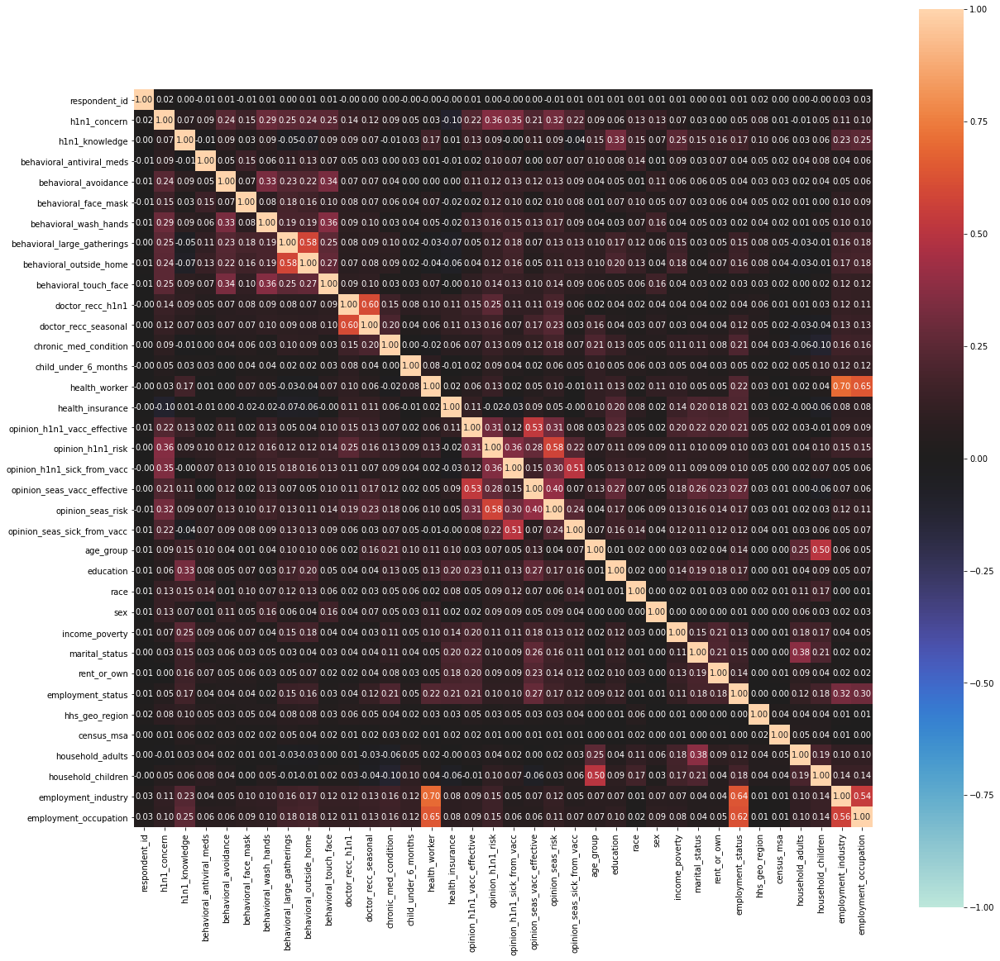

{'ax': <matplotlib.axes._subplots.AxesSubplot at 0x7fc217260630>,
 'corr':                              respondent_id  ...  employment_occupation
 respondent_id                     1.000000  ...               0.032939
 h1n1_concern                      0.017298  ...               0.099288
 h1n1_knowledge                    0.003655  ...               0.250996
 behavioral_antiviral_meds        -0.008458  ...               0.062864
 behavioral_avoidance              0.011275  ...               0.062892
 behavioral_face_mask             -0.006654  ...               0.093624
 behavioral_wash_hands             0.010508  ...               0.099152
 behavioral_large_gatherings       0.004455  ...               0.176886
 behavioral_outside_home           0.009181  ...               0.183867
 behavioral_touch_face             0.007392  ...               0.116814
 doctor_recc_h1n1                 -0.002178  ...               0.111755
 doctor_recc_seasonal              0.001131  ...              

In [0]:
#Running Theil's Correlation on Categorical Data
from dython.nominal import associations
associations(data, theil_u=True, figsize=(20, 20))

Not very strong correlations except for few employment related columns and risk perceptions - the number of missing values for risk are not that many but a lot of missing values exist for employment history. Will need to see how to handle it. 


High correlations exist amongst doctor recommendations for the two vaccines. Need to be treated somehow so that they dont boost the performance of the model wrongly

#Imputing Missing Values Using KNN Imputer

In [0]:
#Missing values imputation using KNN Imputer and FancyImpute Using the KNN Package
from fancyimpute import KNN
from sklearn.preprocessing import OrdinalEncoder
import numpy as np

#instantiate both packages to use
encoder = OrdinalEncoder()
imputer = KNN()
# create a list of categorical columns to iterate over - only columns with less than 2000 missing values (10% of the data)
large_cat_cols = ['h1n1_concern','h1n1_knowledge','behavioral_antiviral_meds','behavioral_avoidance','behavioral_face_mask',
            'behavioral_wash_hands','behavioral_large_gatherings','behavioral_outside_home','behavioral_touch_face','doctor_recc_h1n1','doctor_recc_seasonal',
            'chronic_med_condition','child_under_6_months','health_worker','opinion_h1n1_vacc_effective','opinion_h1n1_risk','opinion_h1n1_sick_from_vacc',
            'opinion_seas_vacc_effective','opinion_seas_risk','opinion_seas_sick_from_vacc','education','income_poverty','marital_status','rent_or_own','employment_status',
            'health_insurance','employment_industry','employment_occupation']

def encode(data):
    '''function to encode non-null data and replace it in the original data'''
    #retains only non-null values
    nonulls = np.array(data.dropna())
    #reshapes the data for encoding
    impute_reshape = nonulls.reshape(-1,1)
    #encode date
    impute_ordinal = encoder.fit_transform(impute_reshape)
    #Assign back encoded values to non-null values
    data.loc[data.notnull()] = np.squeeze(impute_ordinal)
    return data

#create a for loop to iterate through each column in the data
for columns in large_cat_cols:
    encode(data[columns])

data_large_cat = data.loc[:,large_cat_cols]

encoded_data_large_cats = pd.DataFrame(np.round(imputer.fit_transform(data_large_cat)),columns = data_large_cat.columns)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-cop

In [0]:
encoded_data_large_cats

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,education,income_poverty,marital_status,rent_or_own,employment_status,health_insurance,employment_industry,employment_occupation
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,2.0,1.0,0.0,1.0,1.0,8.0,15.0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,3.0,3.0,1.0,3.0,0.0,2.0,1.0,1.0,0.0,1.0,12.0,19.0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,3.0,0.0,1.0,2.0,0.0,1.0,0.0,0.0,1.0,14.0,21.0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,2.0,4.0,4.0,3.0,0.0,0.0,2.0,1.0,1.0,1.0,1.0,13.0,16.0
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,2.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,1.0,18.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,4.0,1.0,1.0,3.0,0.0,1.0,0.0,1.0,1.0,15.0,13.0
26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,4.0,2.0
26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,1.0,4.0,3.0,1.0,3.0,0.0,1.0,0.0,0.0,1.0,9.0,10.0
26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,3.0,0.0,0.0,1.0,0.0,0.0,4.0,6.0


In [0]:
encoded_data_large_cats.shape

(26707, 28)

In [0]:
#Preparing the final dataset
remain_cols = ['respondent_id','age_group','race','sex','hhs_geo_region','census_msa']

remain_data = data.loc[:,remain_cols]

final_data = pd.concat([remain_data,encoded_data_large_cats], axis=1)

final_data.head()

,respondent_id,age_group,race,sex,hhs_geo_region,census_msa,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,education,income_poverty,marital_status,rent_or_own,employment_status,health_insurance,employment_industry,employment_occupation
0,0,55 - 64 Years,White,Female,oxchjgsf,Non-MSA,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,2.0,1.0,0.0,1.0,1.0,8.0,15.0
1,1,35 - 44 Years,White,Male,bhuqouqj,"MSA, Not Principle City",3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,3.0,3.0,1.0,3.0,0.0,2.0,1.0,1.0,0.0,1.0,12.0,19.0
2,2,18 - 34 Years,White,Male,qufhixun,"MSA, Not Principle City",1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,3.0,0.0,1.0,2.0,0.0,1.0,0.0,0.0,1.0,14.0,21.0
3,3,65+ Years,White,Female,lrircsnp,"MSA, Principle City",1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,2.0,4.0,4.0,3.0,0.0,0.0,2.0,1.0,1.0,1.0,1.0,13.0,16.0
4,4,45 - 54 Years,White,Female,qufhixun,"MSA, Not Principle City",2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,2.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,1.0,18.0,5.0


In [0]:
#Making necessary conversions
final_data['age_group']=final_data['age_group'].astype(str)
final_data['race']=final_data['race'].astype(str)
final_data['sex']=final_data['sex'].astype(str)
final_data['hhs_geo_region']=final_data['hhs_geo_region'].astype(str)
final_data['census_msa']=final_data['census_msa'].astype(str)

In [0]:
final_data.dtypes

respondent_id                    int64
age_group                       object
race                            object
sex                             object
hhs_geo_region                  object
census_msa                      object
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_va

In [0]:
data.dtypes

respondent_id                    int64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
education                       object
race                            object
sex                      

#Imputing Missing Values Using Mode

In [0]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imp_data=pd.DataFrame(imputer.fit_transform(data))
imp_data.columns=data.columns
imp_data.index=data.index
imp_data.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,1,2,0,1,1,0,1,55 - 64 Years,1,White,Female,2,1,0,1,oxchjgsf,Non-MSA,0,0,4,21
1,1,3,2,0,1,0,1,0,1,1,0,0,0,0,0,1,4,3,3,3,1,3,35 - 44 Years,0,White,Male,2,1,1,0,bhuqouqj,"MSA, Not Principle City",0,0,12,19
2,2,1,1,0,1,0,0,0,0,0,0,0,1,0,0,1,2,0,0,3,0,1,18 - 34 Years,2,White,Male,0,1,0,0,qufhixun,"MSA, Not Principle City",2,0,14,21
3,3,1,1,0,1,0,1,1,0,0,0,1,1,0,0,1,2,2,4,4,3,0,65+ Years,0,White,Female,2,1,1,1,lrircsnp,"MSA, Principle City",0,0,4,21
4,4,2,1,0,1,0,1,1,0,1,0,0,0,0,0,1,2,2,1,2,0,3,45 - 54 Years,3,White,Female,0,0,0,0,qufhixun,"MSA, Not Principle City",1,0,18,5


In [0]:
imp_data.isnull().sum()

respondent_id                  0
h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
health_insurance               0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
rent_or_own                    0
employment_status              0
hhs_geo_re

#Imputing Missing Values Using Iterative Imputer

In [0]:
#Encoding data
#list of categorical variables
cat_cols = data.columns

#encoding all the categorical data in the data set through looping
for columns in cat_cols:
  encode(data[columns])


from fancyimpute import IterativeImputer
mice_impute = IterativeImputer()
data_fill = pd.DataFrame(mice_impute.fit_transform(data))
data_fill.columns=data.columns
data_fill.index=data.index
data_fill.head()

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setit

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.000000,0.000000,0.0,0.0,0.0,1.000000,2.0,0.0,1.0,1.0,0.0,1.0,3.0,1.0,3.0,0.0,2.0,1.0,0.0,1.0,8.0,2.0,0.0,0.0,9.284343,14.131253
1,1.0,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.000000,0.000000,0.0,0.0,0.0,1.000000,4.0,3.0,3.0,3.0,1.0,3.0,1.0,0.0,3.0,1.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,12.000000,19.000000
2,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.079332,0.116955,1.0,0.0,0.0,0.651820,2.0,0.0,0.0,3.0,0.0,1.0,0.0,2.0,3.0,1.0,0.0,1.0,0.0,0.0,9.0,0.0,2.0,0.0,14.000000,21.000000
3,3.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.000000,1.000000,1.0,0.0,0.0,0.892368,2.0,2.0,4.0,4.0,3.0,0.0,4.0,0.0,3.0,0.0,2.0,1.0,1.0,1.0,5.0,1.0,0.0,0.0,10.237557,14.580638
4,4.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.000000,0.000000,0.0,0.0,0.0,0.888386,2.0,2.0,1.0,2.0,0.0,3.0,2.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,1.0,0.0,18.000000,5.000000


In [0]:
data_fill.isnull().sum()

respondent_id                  0
h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
health_insurance               0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
age_group                      0
education                      0
race                           0
sex                            0
income_poverty                 0
marital_status                 0
rent_or_own                    0
employment_status              0
hhs_geo_re

In [0]:
data_fill.dtypes

respondent_id                  float64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                      float64
education                      float64
race                           float64
sex                      

In [0]:
data_fill.describe()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
count,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000,26707.000000
mean,13353.000000,1.618243,1.261900,0.048871,0.724917,0.069010,0.825477,0.358838,0.337484,0.676983,0.219557,0.329025,0.283082,0.082742,0.111255,0.876519,2.848950,1.342362,1.359010,3.023596,1.717893,1.119778,2.186131,1.722202,2.570300,0.406223,0.552005,0.463946,0.243356,0.519931,4.829745,0.833489,0.888367,0.538648,10.085348,12.298922
std,7709.791156,0.909172,0.617043,0.215279,0.444905,0.253350,0.379220,0.479101,0.472290,0.466645,0.399178,0.453172,0.443067,0.271118,0.310849,0.259046,1.001309,1.278501,1.354732,1.078847,1.374763,1.321467,1.457320,1.074478,0.923226,0.491136,0.645303,0.488935,0.413792,0.589415,2.805984,0.823313,0.750259,0.925139,4.931232,5.124132
min,0.000000,0.000000,0.000000,-0.026836,0.000000,-0.034631,0.000000,0.000000,0.000000,0.000000,-0.160330,-0.171566,-0.026021,-0.005981,-0.196667,0.000000,0.000000,-0.344107,0.000000,0.000000,-0.241106,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.457972,-0.250076,-0.198253,0.000000,0.000000,0.000000,-0.107730,0.000000,0.000000
25%,6676.500000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.846982,2.000000,0.000000,0.000000,3.000000,1.000000,0.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,7.000000,10.000000
50%,13353.000000,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,3.000000,1.000000,1.000000,3.000000,1.000000,1.000000,2.000000,2.000000,3.000000,0.000000,0.355197,0.000000,0.000000,0.000000,5.000000,1.000000,1.000000,0.000000,10.411846,12.854880
75%,20029.500000,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.162297,1.000000,1.000000,0.000000,0.000000,1.000000,4.000000,3.000000,3.000000,4.000000,3.000000,2.000000,4.000000,3.000000,3.000000,1.000000,1.000000,1.000000,0.332692,1.000000,7.000000,2.000000,1.000000,1.000000,12.000000,15.000000
max,26706.000000,3.000000,2.000000,1.000000,1.042033,1.000000,1.120793,1.000000,1.000000,1.032246,1.000000,1.000000,1.000000,1.000000,1.000000,1.337270,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000,1.000000,2.000000,1.160901,1.000000,2.000000,9.000000,2.000000,3.000000,3.000000,20.000000,22.000000


#Converting MICE row values into categorical approximations

In [0]:
data_fill['h1n1_knowledge'].unique()

array([0.        , 2.        , 1.        , 1.45044545, 0.99396872,
       1.20056149, 0.94207227, 1.48008499, 0.89497057, 1.11688293,
       1.35316387, 1.17520615, 0.92342824, 0.94573437, 0.87788343,
       1.16899026, 1.23260871, 0.96048482, 1.1539327 , 1.3257521 ,
       0.84283232, 1.11578037, 0.94279753, 0.9619248 , 0.90576647,
       0.94991058, 1.15642139, 1.03158068, 0.78052237, 0.92749112,
       1.00165369, 1.13290048, 0.82499908, 1.5411555 , 1.31098402,
       1.33828119, 1.24097216, 0.95766406, 1.16659751, 1.22347044,
       0.82555989, 1.24087948, 1.22185829, 1.27649782, 1.32575229,
       0.76870584, 0.65096792, 1.35738648, 1.22567152, 1.39702079,
       0.97915555, 0.93368423, 1.22901492, 0.92340845, 1.04728591,
       1.18266938, 1.04849266, 1.17863907, 1.2566127 , 1.37540853,
       1.54482973, 1.52703231, 1.2201069 , 1.05176657, 0.94062006,
       1.09160008, 1.26081149, 1.12517506, 1.31408987, 0.88948074,
       0.68600412, 1.11447118, 1.22250688, 1.35881593, 1.25521

In [0]:
data_fill_1.dtypes

respondent_id                  float64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                      float64
education                      float64
race                           float64
sex                      

In [0]:
data_fill_1 = data_fill.copy()

for i in list(data_fill_1.columns):
  data_fill_1[i] = data_fill_1[i].astype(float)

In [0]:
data_fill_1.loc[data_fill_1.h1n1_concern < 0.5, 'h1n1_concern'] = 0
data_fill_1.loc[(data_fill_1.h1n1_concern > 0.5) & (data_fill_1.h1n1_concern < 1.5), 'h1n1_concern'] = 1
data_fill_1.loc[(data_fill_1.h1n1_concern > 1.5) & (data_fill_1.h1n1_concern < 2.5), 'h1n1_concern'] = 2
data_fill_1.loc[(data_fill_1.h1n1_concern > 2.5), 'h1n1_concern'] = 3

data_fill_1.h1n1_concern.unique()

array([1., 3., 2., 0.])

In [0]:
data_fill_1.loc[data_fill_1.h1n1_knowledge < 0.5, 'h1n1_knowledge'] = 0
data_fill_1.loc[(data_fill_1.h1n1_knowledge > 0.5) & (data_fill_1.h1n1_knowledge < 1.5), 'h1n1_knowledge'] = 1
data_fill_1.loc[(data_fill_1.h1n1_knowledge > 1.5), 'h1n1_knowledge'] = 2

data_fill_1.h1n1_knowledge.unique()

array([0., 2., 1.])

In [0]:
data_fill_1.behavioral_touch_face.unique()

array([1.        , 0.        , 0.70101985, 0.6662532 , 0.20082823,
       0.302221  , 0.74473995, 0.67885652, 0.42442715, 0.65612177,
       0.62651193, 0.42925986, 0.68525685, 0.17792302, 0.39881065,
       0.7029208 , 0.80477044, 0.72664417, 0.7079812 , 0.67847395,
       0.47672844, 0.56565998, 0.21100325, 0.85632578, 0.37223865,
       0.42219832, 0.78925226, 0.91108591, 0.32597903, 0.81087842,
       0.74709087, 0.50438332, 0.84967007, 0.7554611 , 0.67871425,
       0.54577131, 0.5490856 , 0.42194944, 0.65925149, 0.86068452,
       0.64987601, 0.91438303, 0.72741314, 0.65195094, 0.55739426,
       0.71543842, 0.51065629, 1.0233959 , 0.74649216, 0.87297326,
       0.17169071, 0.74171265, 0.76180354, 0.63671953, 0.57949542,
       0.73421664, 0.47415774, 0.81264712, 0.48572206, 0.35926795,
       0.60077238, 0.86809291, 0.84661233, 0.91620721, 1.01400399,
       0.56967575, 0.80921358, 0.4243246 , 0.46858192, 0.81287326,
       0.51240083, 0.53537786, 0.35862591, 0.96011926, 0.33571

In [0]:
binary_vars = ['behavioral_antiviral_meds','behavioral_avoidance','behavioral_face_mask','behavioral_wash_hands','behavioral_large_gatherings',
               'behavioral_outside_home','behavioral_touch_face','doctor_recc_h1n1','doctor_recc_seasonal','chronic_med_condition','child_under_6_months',
               'health_worker','health_insurance']

for i in binary_vars:
  data_fill_1.loc[data_fill_1[i] < 0.5, i] = 0
  data_fill_1.loc[data_fill_1[i] > 0.5, i] = 1

In [0]:
data_fill.income_poverty.unique()

array([2.        , 0.        , 1.        , ..., 0.44369663, 0.39994034,
       0.31579051])

In [0]:
multi_vars = ['opinion_h1n1_vacc_effective','opinion_h1n1_risk','opinion_h1n1_sick_from_vacc','opinion_seas_vacc_effective','opinion_seas_risk',
              'opinion_seas_sick_from_vacc']

for i in multi_vars:
  data_fill_1.loc[data_fill_1[i] < 0.5, i] = 0
  data_fill_1.loc[(data_fill_1[i] > 0.5) & (data_fill_1[i] < 1.5), i] = 1
  data_fill_1.loc[(data_fill_1[i] > 1.5) & (data_fill_1[i] < 2.5), i] = 2
  data_fill_1.loc[(data_fill_1[i] > 2.5) & (data_fill_1[i] < 3.5), i] = 3
  data_fill_1.loc[(data_fill_1[i] > 3.5) & (data_fill_1[i] < 4.5), i] = 4
  data_fill_1.loc[(data_fill_1[i] > 4.5), i] = 4


In [0]:
data_fill.employment_status.unique()

array([ 1.        ,  0.        ,  2.        , ..., -0.0514588 ,
        0.33218488,  0.54038603])

In [0]:
#education
data_fill_1.loc[data_fill_1.education < 0.5, 'education'] = 0
data_fill_1.loc[(data_fill_1.education > 0.5) & (data_fill_1.education < 1.5), 'education'] = 1
data_fill_1.loc[(data_fill_1.education > 1.5), 'education'] = 2

#income_poverty
data_fill_1.loc[data_fill_1.income_poverty < 0.5, 'income_poverty'] = 0
data_fill_1.loc[(data_fill_1.income_poverty > 0.5) & (data_fill_1.income_poverty < 1.5), 'income_poverty'] = 1
data_fill_1.loc[(data_fill_1.income_poverty > 1.5), 'income_poverty'] = 2

#marital status
data_fill_1.loc[data_fill_1.marital_status < 0.5, 'marital_status'] = 0
data_fill_1.loc[data_fill_1.marital_status > 0.5, 'marital_status'] = 1

#rent_own
data_fill_1.loc[data_fill_1.rent_or_own < 0.5, 'rent_or_own'] = 0
data_fill_1.loc[data_fill_1.rent_or_own > 0.5, 'rent_or_own'] = 1

#household_adults
data_fill_1.loc[data_fill_1.household_adults < 0.5, 'household_adults'] = 0
data_fill_1.loc[(data_fill_1.household_adults > 0.5) & (data_fill_1.household_adults < 1.5), 'household_adults'] = 1
data_fill_1.loc[(data_fill_1.household_adults > 1.5) & (data_fill_1.household_adults < 2.5), 'household_adults'] = 2
data_fill_1.loc[(data_fill_1.household_adults > 2.5), 'household_adults'] = 3

#household_children
data_fill_1.loc[data_fill_1.household_children < 0.5, 'household_children'] = 0
data_fill_1.loc[(data_fill_1.household_children > 0.5) & (data_fill_1.household_children < 1.5), 'household_children'] = 1
data_fill_1.loc[(data_fill_1.household_children > 1.5) & (data_fill_1.household_children < 2.5), 'household_children'] = 2
data_fill_1.loc[(data_fill_1.household_children > 2.5), 'household_children'] = 3

#employment_status
data_fill_1.loc[data_fill_1.employment_status < 0.5, 'employment_status'] = 0
data_fill_1.loc[(data_fill_1.employment_status > 0.5) & (data_fill_1.employment_status < 1.5), 'employment_status'] = 1
data_fill_1.loc[(data_fill_1.employment_status > 1.5), 'employment_status'] = 2

In [0]:
data_fill_1

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,3.0,1.0,3.0,0.0,2.0,1.0,0.0,1.0,8.0,2.0,0.0,0.0,9.284343,14.131253
1,1.0,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,3.0,3.0,1.0,3.0,1.0,0.0,3.0,1.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,12.000000,19.000000
2,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,3.0,0.0,1.0,0.0,2.0,3.0,1.0,0.0,1.0,0.0,0.0,9.0,0.0,2.0,0.0,14.000000,21.000000
3,3.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,4.0,4.0,3.0,0.0,4.0,0.0,3.0,0.0,2.0,1.0,1.0,1.0,5.0,1.0,0.0,0.0,10.237557,14.580638
4,4.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,2.0,0.0,3.0,2.0,2.0,3.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,1.0,0.0,18.000000,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,4.0,1.0,1.0,4.0,2.0,3.0,0.0,0.0,1.0,0.0,1.0,9.0,2.0,0.0,0.0,11.052693,14.379797
26703,26703.0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,1.0,1.0,4.0,0.0,0.0,0.0,2.0,3.0,1.0,0.0,1.0,1.0,0.0,6.0,1.0,1.0,0.0,4.000000,2.000000
26704,26704.0,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,1.0,4.0,3.0,1.0,3.0,2.0,3.0,0.0,0.0,1.0,0.0,1.0,6.0,0.0,0.0,0.0,9.166190,11.385457
26705,26705.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,5.0,2.0,1.0,0.0,4.000000,6.000000


#Running the models for Data Imputed Using Mice - Not Used

Running the models for Data Imputed Using Mice - H1N1 Vaccine


Decision Trees

In [0]:
data_fill.dtypes

respondent_id                  float64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                      float64
education                      float64
race                           float64
sex                      

In [0]:
#education
data_fill.loc[data_fill.education < 0.5, 'education'] = 0
data_fill.loc[(data_fill.education > 0.5) & (data_fill.education < 1.5), 'education'] = 1
data_fill.loc[(data_fill.education > 1.5), 'education'] = 2

#income_poverty
data_fill.loc[data_fill.income_poverty < 0.5, 'income_poverty'] = 0
data_fill.loc[(data_fill.income_poverty > 0.5) & (data_fill.income_poverty < 1.5), 'income_poverty'] = 1
data_fill.loc[(data_fill.income_poverty > 1.5), 'income_poverty'] = 2

#household_adults
data_fill.loc[data_fill.household_adults < 0.5, 'household_adults'] = 0
data_fill.loc[(data_fill.household_adults > 0.5) & (data_fill.household_adults < 1.5), 'household_adults'] = 1
data_fill.loc[(data_fill.household_adults > 1.5) & (data_fill.household_adults < 2.5), 'household_adults'] = 2
data_fill.loc[(data_fill.household_adults > 2.5), 'household_adults'] = 3

#household_children
data_fill.loc[data_fill.household_children < 0.5, 'household_children'] = 0
data_fill.loc[(data_fill.household_children > 0.5) & (data_fill.household_children < 1.5), 'household_children'] = 1
data_fill.loc[(data_fill.household_children > 1.5) & (data_fill.household_children < 2.5), 'household_children'] = 2
data_fill.loc[(data_fill.household_children > 2.5), 'household_children'] = 3

#employment_status
data_fill.loc[data_fill.employment_status < 0.5, 'employment_status'] = 0
data_fill.loc[(data_fill.employment_status > 0.5) & (data_fill.employment_status < 1.5), 'employment_status'] = 1
data_fill.loc[(data_fill.employment_status > 1.5), 'employment_status'] = 2

In [0]:
cat_cols = ['age_group','education','race','income_poverty','employment_status','hhs_geo_region','census_msa']

for i in cat_cols:
  data_fill[i] = data_fill[i].astype('object')

In [0]:
#Decision Tree 

X = data_fill.loc[:,"h1n1_concern":"household_children"]
y = trainY['h1n1_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
X

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,sex,marital_status,rent_or_own,household_adults,household_children,age_group_0.0,age_group_1.0,age_group_2.0,age_group_3.0,age_group_4.0,education_0,education_1,education_2,race_0.0,race_1.0,race_2.0,race_3.0,income_poverty_0,income_poverty_1,income_poverty_2,employment_status_0,employment_status_1,employment_status_2,hhs_geo_region_0.0,hhs_geo_region_1.0,hhs_geo_region_2.0,hhs_geo_region_3.0,hhs_geo_region_4.0,hhs_geo_region_5.0,hhs_geo_region_6.0,hhs_geo_region_7.0,hhs_geo_region_8.0,hhs_geo_region_9.0,census_msa_0.0,census_msa_1.0,census_msa_2.0
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,1.000000,2.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,1.000000,4.0,3.0,3.0,3.0,1.0,3.0,1.0,1.0,1.0,0.0,0.0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.000000,0.079332,0.116956,1.0,0.0,0.0,0.651820,2.0,0.0,0.0,3.0,0.0,1.0,1.0,1.0,0.0,2.0,0.0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.000000,0.000000,1.000000,1.0,0.0,0.0,0.892368,2.0,2.0,4.0,4.0,3.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.888386,2.0,2.0,1.0,2.0,0.0,3.0,0.0,0.0,0.0,1.0,0.0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.879109,2.0,0.0,0.0,4.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1
26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.000000,1.000000,1.000000,0.0,0.0,1.0,1.000000,3.0,1.0,1.0,4.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.000000,0.000000,0.000000,0.0,0.0,0.0,0.936983,3.0,3.0,1.0,4.0,3.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0
26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.227337,0.000000,0.000000,0.0,0.0,0.0,0.000000,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1


In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,25):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

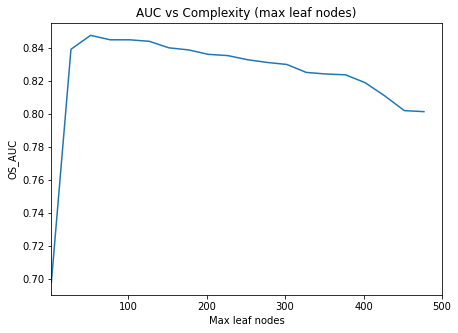

In [0]:
plt.figure(figsize=(7,5))
plt.plot(range(2,500,25),AUC_OS)
plt.xlabel("Max leaf nodes")
plt.ylabel("OS_AUC")
plt.title("AUC vs Complexity (max leaf nodes)")
plt.xlim(2,500)
plt.show()

In [0]:
AUC_OS

[0.6976430557284535,
 0.8392367784259791,
 0.8476822964480044,
 0.8449910102562092,
 0.8449753783906226,
 0.8440529088438653,
 0.8400929783365081,
 0.8388476397114566,
 0.8361523744993303,
 0.835384328836851,
 0.8329052570627137,
 0.8312407475934981,
 0.830026862176778,
 0.8251805101520914,
 0.8242101976227816,
 0.8237274098226096,
 0.8189469484798343,
 0.8109350015660287,
 0.8019863743185691,
 0.8013523363765259]

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier(max_leaf_nodes=60)
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 9}
0.8467006626584668


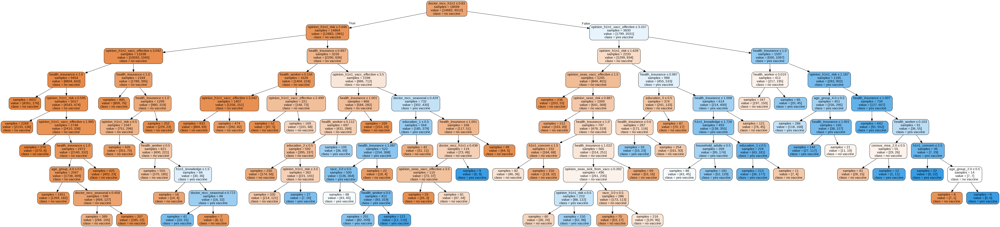

In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=9,max_leaf_nodes=60)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [0]:
pd.DataFrame({"importance":dt.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:20]

,importance
doctor_recc_h1n1,0.442887
health_insurance,0.186067
opinion_h1n1_risk,0.142144
opinion_h1n1_vacc_effective,0.115962
health_worker,0.028168
doctor_recc_seasonal,0.021460
opinion_seas_vacc_effective,0.010814
education_1,0.009080
race_3.0,0.006557
age_group_4.0,0.006156


Random Forest

In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 9}
Accuracy =  0.8467490328216648


In [0]:
#Feature Importance (Gini importance)
rf = RandomForestClassifier(max_depth=9)
rf.fit(X_train,y_train)

pd.DataFrame({"importance":rf.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:20]

,importance
doctor_recc_h1n1,0.240046
opinion_h1n1_risk,0.125343
opinion_h1n1_vacc_effective,0.111181
health_insurance,0.100678
opinion_seas_risk,0.053766
doctor_recc_seasonal,0.041962
health_worker,0.036707
opinion_seas_vacc_effective,0.034423
h1n1_concern,0.015674
h1n1_knowledge,0.015087


XGBoost

[02:28:52] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
The RMSE is: 0.32425823254489794
The R2 for XGBoost Model is: 0.36041366609676884


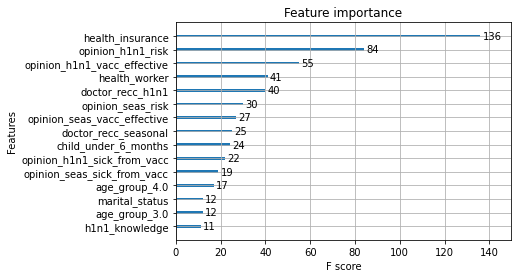

In [0]:
# Model 3 - XGBoost
import xgboost as xg

xgbf = xg.XGBRegressor().fit(X_train,y_train)

from sklearn.metrics import mean_squared_error, r2_score

x_pred = xgbf.predict(X_test)
print("The RMSE is: {0}".format(np.sqrt(mean_squared_error(y_test, x_pred))))
print("The R2 for XGBoost Model is: {0}".format(r2_score(y_test, x_pred)))

from xgboost import plot_importance
plot_importance(xgbf, max_num_features=15) 
plt.show()

SVM

In [0]:
from sklearn import preprocessing
X_scaled = preprocessing.scale(X)
X=X_scaled

X_train,X_test,y_train,y_test = train_test_split(X, y, test_size=0.33, random_state=2999)

In [0]:
from sklearn import svm

from sklearn.model_selection import GridSearchCV
param_grid ={'kernel':["poly"],
            'C':10**np.linspace(-5,10,20),
            'coef0':10**np.linspace(-3,3,20),
            'degree':range(1,7),
            'max_iter':[100]}

rr=svm.SVC()
gr=GridSearchCV(rr,param_grid=param_grid)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(1.0*(rs.predict(X_test)==np.asarray(y_test)).sum()/len(y_test))

#Using Seasonal Vaccine as a feature - Not Used

In [0]:
#Decision Tree 

X = data_fill.loc[:,"h1n1_concern":"employment_occupation"]
X['seasonal_vaccine'] = trainY['seasonal_vaccine']
y = trainY['h1n1_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,20):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

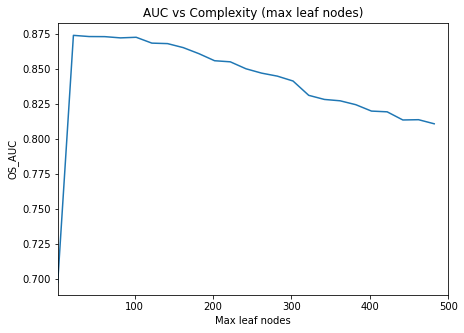

In [0]:
plt.figure(figsize=(7,5))
plt.plot(range(2,500,20),AUC_OS)
plt.xlabel("Max leaf nodes")
plt.ylabel("OS_AUC")
plt.title("AUC vs Complexity (max leaf nodes)")
plt.xlim(2,500)
plt.show()

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier(max_leaf_nodes=80)
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 6}
0.8772926499346967


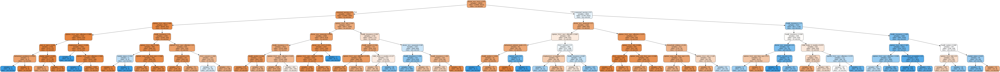

In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=6)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [0]:
pd.DataFrame({"importance":dt.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:10]

,importance
doctor_recc_h1n1,0.375768
seasonal_vaccine,0.258385
health_insurance,0.124086
opinion_h1n1_risk,0.086900
doctor_recc_seasonal,0.070878
opinion_h1n1_vacc_effective,0.040832
health_worker,0.014604
h1n1_concern,0.006082
child_under_6_months,0.006056
marital_status,0.003767


In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 8}
Accuracy =  0.8630974666167478


In [0]:
#Feature Importance (Gini importance)
rf = RandomForestClassifier(n_estimators=100,max_depth=9)
rf.fit(X_train,y_train)

pd.DataFrame({"importance":rf.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:10]

,importance
doctor_recc_h1n1,0.218400
seasonal_vaccine,0.164105
opinion_h1n1_risk,0.098510
health_insurance,0.091206
opinion_h1n1_vacc_effective,0.070143
opinion_seas_risk,0.041155
doctor_recc_seasonal,0.040758
employment_occupation,0.033564
employment_industry,0.026787
health_worker,0.020872


#Running the model with MICE - but using approximations instead of MICE predicted values

In [0]:
data_fill_1

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,3.0,1.0,3.0,0.0,2.0,1.0,0.0,1.0,8.0,2.0,0.0,0.0,9.284343,14.131253
1,1.0,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,3.0,3.0,1.0,3.0,1.0,0.0,3.0,1.0,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,12.000000,19.000000
2,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,3.0,0.0,1.0,0.0,2.0,3.0,1.0,0.0,1.0,0.0,0.0,9.0,0.0,2.0,0.0,14.000000,21.000000
3,3.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,4.0,4.0,3.0,0.0,4.0,0.0,3.0,0.0,2.0,1.0,1.0,1.0,5.0,1.0,0.0,0.0,10.237557,14.580638
4,4.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,2.0,0.0,3.0,2.0,2.0,3.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,1.0,0.0,18.000000,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,4.0,1.0,1.0,4.0,2.0,3.0,0.0,0.0,1.0,0.0,1.0,9.0,2.0,0.0,0.0,11.052693,14.379797
26703,26703.0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,1.0,1.0,4.0,0.0,0.0,0.0,2.0,3.0,1.0,0.0,1.0,1.0,0.0,6.0,1.0,1.0,0.0,4.000000,2.000000
26704,26704.0,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,1.0,4.0,3.0,1.0,3.0,2.0,3.0,0.0,0.0,1.0,0.0,1.0,6.0,0.0,0.0,0.0,9.166190,11.385457
26705,26705.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,1.0,0.0,5.0,2.0,1.0,0.0,4.000000,6.000000


In [0]:
data_fill_1.dtypes

respondent_id                  float64
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                      float64
education                      float64
race                           float64
sex                      

In [0]:
cat_cols = ['age_group','education','race','income_poverty','employment_status','hhs_geo_region','census_msa']

In [0]:
#Convertin into object
for i in cat_cols:
  data_fill_1[i] = data_fill_1[i].astype('object')

In [0]:
#Decision Tree 

X = data_fill_1.loc[:,"h1n1_concern":"household_children"]
#X['seasonal_vaccine'] = trainY['seasonal_vaccine']
y = trainY['h1n1_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X,drop_first=True)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
X

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,sex,marital_status,rent_or_own,household_adults,household_children,age_group_1.0,age_group_2.0,age_group_3.0,age_group_4.0,education_1.0,education_2.0,race_1.0,race_2.0,race_3.0,income_poverty_1.0,income_poverty_2.0,employment_status_1.0,employment_status_2.0,hhs_geo_region_1.0,hhs_geo_region_2.0,hhs_geo_region_3.0,hhs_geo_region_4.0,hhs_geo_region_5.0,hhs_geo_region_6.0,hhs_geo_region_7.0,hhs_geo_region_8.0,hhs_geo_region_9.0,census_msa_1.0,census_msa_2.0
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,1,0,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,3.0,3.0,1.0,3.0,1.0,1.0,1.0,0.0,0.0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,3.0,0.0,1.0,1.0,1.0,0.0,2.0,0.0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,2.0,4.0,4.0,3.0,0.0,0.0,1.0,1.0,0.0,0.0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,1.0,2.0,0.0,3.0,0.0,0.0,0.0,1.0,0.0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,4.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1
26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,1.0,1.0,4.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,1.0,4.0,3.0,1.0,0.0,1.0,0.0,0.0,0.0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1


In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,25):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

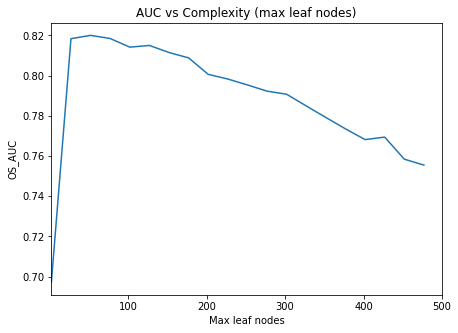

In [0]:
plt.figure(figsize=(7,5))
plt.plot(range(2,500,25),AUC_OS)
plt.xlabel("Max leaf nodes")
plt.ylabel("OS_AUC")
plt.title("AUC vs Complexity (max leaf nodes)")
plt.xlim(2,500)
plt.show()

In [0]:
AUC_OS

[0.6970497553755144,
 0.8169417117101243,
 0.8199386245587786,
 0.8202912415509767,
 0.817981657095228,
 0.8141815979404591,
 0.8151910375030246,
 0.8124753561270566,
 0.8095805714668999,
 0.8068384580273041,
 0.8012395500978555,
 0.7990962318487987,
 0.7954906709973567,
 0.793551561756006,
 0.7915611042046687,
 0.791711359591457,
 0.7862861548471762,
 0.7789157775924692,
 0.7736586864571771,
 0.7725594820907139,
 0.7684898916778033,
 0.7675670905460183,
 0.7571257622429244,
 0.7581988187614978,
 0.753751031939975]

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier()
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 5}
0.8220206469470207


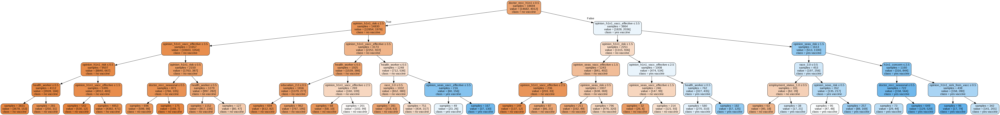

In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=5)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [0]:
#Getting important features
pd.DataFrame({"importance":dt.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:12]

,importance
doctor_recc_h1n1,0.556378
opinion_h1n1_vacc_effective,0.167369
opinion_h1n1_risk,0.156327
health_worker,0.050538
opinion_seas_risk,0.017587
opinion_seas_vacc_effective,0.016214
race_3.0,0.014257
h1n1_concern,0.006428
opinion_h1n1_sick_from_vacc,0.004856
doctor_recc_seasonal,0.004692


In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 8}
Accuracy =  0.835891676026457


In [0]:
#Feature Importance (Gini importance)
rf = RandomForestClassifier(max_depth=9)
rf.fit(X_train,y_train)

pd.DataFrame({"importance":rf.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:10]

,importance
doctor_recc_h1n1,0.269561
opinion_h1n1_risk,0.132006
opinion_h1n1_vacc_effective,0.123182
opinion_seas_risk,0.065131
opinion_seas_vacc_effective,0.042667
health_worker,0.042079
doctor_recc_seasonal,0.036418
h1n1_concern,0.019185
opinion_h1n1_sick_from_vacc,0.019167
h1n1_knowledge,0.019031


Seasonal Vaccine

In [0]:
#Decision Tree 

X = data_fill_1.loc[:,"h1n1_concern":"household_children"]
#X['seasonal_vaccine'] = trainY['seasonal_vaccine']
y = trainY['seasonal_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X,drop_first=True)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,25):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

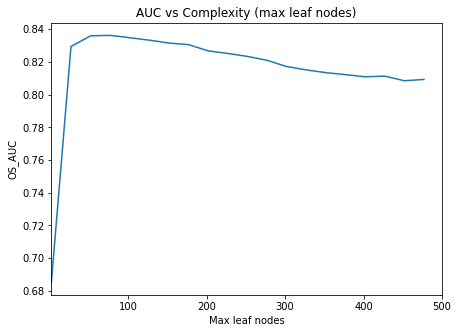

In [0]:
plt.figure(figsize=(7,5))
plt.plot(range(2,500,25),AUC_OS)
plt.xlabel("Max leaf nodes")
plt.ylabel("OS_AUC")
plt.title("AUC vs Complexity (max leaf nodes)")
plt.xlim(2,500)
plt.show()

In [0]:
AUC_OS


[0.6851371138003419,
 0.829446027750488,
 0.8359749958373763,
 0.8362758114097636,
 0.8348206223662917,
 0.8333200657568756,
 0.8315683998271569,
 0.8305921640058573,
 0.826786318827282,
 0.8252102124874682,
 0.8234005087706854,
 0.8210303914274604,
 0.8171880446937493,
 0.815154835761237,
 0.81345570566152,
 0.8122531979260829,
 0.8109245224552788,
 0.8113264482785854,
 0.8085177149183899,
 0.809295345809634]

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier()
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 6}
0.8320432344414715


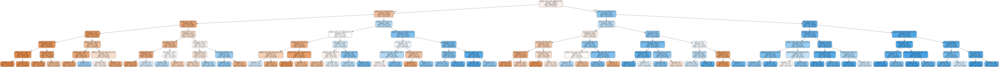

In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=6)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [0]:
#Getting important features
pd.DataFrame({"importance":dt.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:20]

,importance
opinion_seas_vacc_effective,0.399909
doctor_recc_seasonal,0.254485
opinion_seas_risk,0.164944
age_group_4.0,0.076892
health_worker,0.018776
rent_or_own,0.014964
opinion_seas_sick_from_vacc,0.013446
education_2.0,0.011104
race_1.0,0.008774
education_1.0,0.005012


In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 9}
Accuracy =  0.7794833395731936


In [0]:
#Feature Importance (Gini importance)
rf = RandomForestClassifier(max_depth=9)
rf.fit(X_train,y_train)

pd.DataFrame({"importance":rf.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:20]

,importance
opinion_seas_risk,0.192065
opinion_seas_vacc_effective,0.174975
doctor_recc_seasonal,0.171773
age_group_4.0,0.076748
opinion_h1n1_risk,0.034093
opinion_h1n1_vacc_effective,0.025671
doctor_recc_h1n1,0.024636
opinion_seas_sick_from_vacc,0.024122
health_worker,0.021221
employment_status_1.0,0.018488


#Running the models with missing filled with SimpleImpute - Not Used

Running the models with missing filled with SimpleImpute- H1N1 Vaccine

In [0]:
#Decision Tree 

X = imp_data.loc[:,"h1n1_concern":"employment_occupation"]
y = trainY['h1n1_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,20):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier(max_leaf_nodes=80)
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 7}
0.8191339624353955


In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=9,max_leaf_nodes=80)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())

18 [label=<income_poverty_> $75,000 &le; 0.5<br/>samples = 48<br/>value = [22, 26]<br/>class = yes vaccine>, fillcolor="#e1f0fb"] ;
   ^
Expected "}", found '['  (at char 11063), (line:175, col:4)


AttributeError: ignored

In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 9}
Accuracy =  0.8373892424809685


Running the models with missing filled with SimpleImpute- H1N1 Vaccine

In [0]:
#Decision Tree 

X = imp_data.loc[:,"h1n1_concern":"employment_occupation"]
y = trainY['seasonal_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,20):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier(max_leaf_nodes=100)
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 10}
0.8343221450564885


In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=10,max_leaf_nodes=100)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())

85 [label=<income_poverty_> $75,000 &le; 0.5<br/>samples = 1602<br/>value = [1419, 183]<br/>class = no vaccine>, fillcolor="#e89153"] ;
   ^
Expected "}", found '['  (at char 1490), (line:21, col:4)


AttributeError: ignored

In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 9}
Accuracy =  0.7829776613003868


#Running the models with KNN imputation

Running the models with KNN imputation - H1N1 Vaccine

In [0]:
knn_data = final_data.loc[:,"h1n1_concern":"employment_occupation"]

In [0]:
knn_data

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,education,income_poverty,marital_status,rent_or_own,employment_status,health_insurance,employment_industry,employment_occupation
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,2.0,1.0,0.0,1.0,1.0,8.0,15.0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0,3.0,3.0,1.0,3.0,0.0,2.0,1.0,1.0,0.0,1.0,12.0,19.0
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,3.0,0.0,1.0,2.0,0.0,1.0,0.0,0.0,1.0,14.0,21.0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,2.0,4.0,4.0,3.0,0.0,0.0,2.0,1.0,1.0,1.0,1.0,13.0,16.0
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,2.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,1.0,18.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,4.0,1.0,1.0,3.0,0.0,1.0,0.0,1.0,1.0,15.0,13.0
26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,4.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,4.0,2.0
26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,1.0,4.0,3.0,1.0,3.0,0.0,1.0,0.0,0.0,1.0,9.0,10.0
26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,3.0,0.0,0.0,1.0,0.0,0.0,4.0,6.0


In [0]:
#KMeans
from sklearn.metrics import silhouette_samples
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

range_n_clusters = range(2,10)
for n_clusters in range_n_clusters: #try different numbers of clusters
    km = KMeans(n_clusters=n_clusters, random_state=30)
    cluster_labels = km.fit_predict(knn_data)
    #report average Silhouette score
    silhouette_avg = silhouette_score(knn_data, cluster_labels)
    print("For n_clusters ={},".format(n_clusters)+" the average silhouette_score is :{}".format(silhouette_avg))

For n_clusters =2, the average silhouette_score is :0.2545286616909105
For n_clusters =3, the average silhouette_score is :0.24796785868273474
For n_clusters =4, the average silhouette_score is :0.24523815749941041
For n_clusters =5, the average silhouette_score is :0.23927829477596918
For n_clusters =6, the average silhouette_score is :0.21410248691427292
For n_clusters =7, the average silhouette_score is :0.20366695927219536
For n_clusters =8, the average silhouette_score is :0.19988356982118183
For n_clusters =9, the average silhouette_score is :0.19040310076861724


NameError: ignored

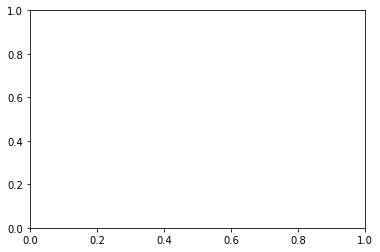

In [0]:
plt.gca()
plt.plot(range(2,30),SSE)
plt.xlabel("Clusters")
plt.ylabel("Sum of squared errors")
plt.title("SSE vs. number of clusters")
plt.xlim(1.5,29.5)
plt.show()

In [0]:
final_data.dtypes

respondent_id                    int64
age_group                       object
race                            object
sex                             object
hhs_geo_region                  object
census_msa                      object
h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_va

In [0]:
cat_cols = ['age_group','education','race','income_poverty','employment_status','hhs_geo_region','census_msa']

for i in cat_cols:
  final_data[i] = final_data[i].astype('object')

In [0]:
final_data.isnull().sum()

respondent_id                  0
age_group                      0
race                           0
sex                            0
hhs_geo_region                 0
census_msa                     0
h1n1_concern                   0
h1n1_knowledge                 0
behavioral_antiviral_meds      0
behavioral_avoidance           0
behavioral_face_mask           0
behavioral_wash_hands          0
behavioral_large_gatherings    0
behavioral_outside_home        0
behavioral_touch_face          0
doctor_recc_h1n1               0
doctor_recc_seasonal           0
chronic_med_condition          0
child_under_6_months           0
health_worker                  0
opinion_h1n1_vacc_effective    0
opinion_h1n1_risk              0
opinion_h1n1_sick_from_vacc    0
opinion_seas_vacc_effective    0
opinion_seas_risk              0
opinion_seas_sick_from_vacc    0
education                      0
income_poverty                 0
marital_status                 0
rent_or_own                    0
employment

In [0]:
#Decision Tree 

X = final_data.loc[:,"age_group":"health_insurance"]
y = trainY['h1n1_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,20):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

In [0]:
AUC_OS

[0.6951884265077788,
 0.8158584707942751,
 0.8203745641314811,
 0.8167421448928042,
 0.8157780851097292,
 0.8156674304490931,
 0.8095303600198647,
 0.810433313419284,
 0.808606279917259,
 0.8046886501855646,
 0.7999793375158522,
 0.7967373833318081,
 0.7917977138064994,
 0.791096411473145,
 0.7873764537871841,
 0.7872174350818096,
 0.7801324577972786,
 0.7759866975666017,
 0.7731493244855079,
 0.7706342046819427,
 0.770303282824407,
 0.7598373698599821,
 0.7576030552054964,
 0.7546848227469604,
 0.747247038993073]

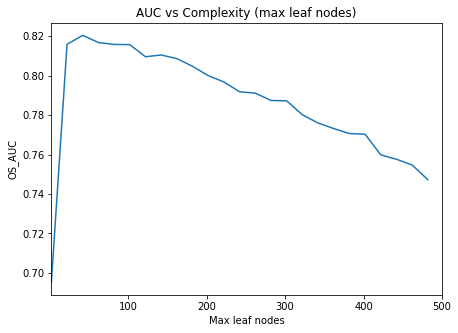

In [0]:
plt.figure(figsize=(7,5))
plt.plot(range(2,500,20),AUC_OS)
plt.xlabel("Max leaf nodes")
plt.ylabel("OS_AUC")
plt.title("AUC vs Complexity (max leaf nodes)")
plt.xlim(2,500)
plt.show()

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier()
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 6}
0.8218345803772529


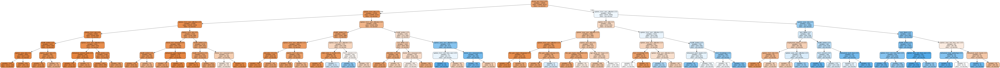

In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=6)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [0]:
pd.DataFrame({"importance":dt.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:20]

,importance
doctor_recc_h1n1,0.515914
opinion_h1n1_vacc_effective,0.162769
opinion_h1n1_risk,0.152475
health_worker,0.057909
opinion_seas_risk,0.018090
opinion_seas_vacc_effective,0.017443
doctor_recc_seasonal,0.013790
race_White,0.012794
race_Black,0.007164
h1n1_concern,0.006540


In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 9}
Accuracy =  0.8351428927992013


In [0]:
#Feature Importance (Gini importance)
rf = RandomForestClassifier(n_estimators=100,max_depth=9)
rf.fit(X_train,y_train)

pd.DataFrame({"importance":rf.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:10]

,importance
doctor_recc_h1n1,0.247350
opinion_h1n1_risk,0.144109
opinion_h1n1_vacc_effective,0.118333
opinion_seas_risk,0.060982
health_worker,0.041714
doctor_recc_seasonal,0.041698
opinion_seas_vacc_effective,0.040528
h1n1_knowledge,0.019544
h1n1_concern,0.019107
opinion_h1n1_sick_from_vacc,0.019057


Running the models with KNN imputation - Seasonal Vaccine

In [0]:
#Decision Tree 

X = final_data.loc[:,"age_group":"health_insurance"]
y = trainY['seasonal_vaccine']

#Transform categorical data to dummy variables
X=pd.get_dummies(X)

#Split to train and test data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 999)

In [0]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_auc_score

AUC_OS=[]
for i in range(2,500,20):
    dt=DecisionTreeClassifier(max_leaf_nodes=i)
    dt.fit(X_train,y_train)
    AUC_OS.append(roc_auc_score(np.array(y_test),dt.predict_proba(X_test)[:,1]))

In [0]:
AUC_OS

[0.6849410240506578,
 0.8223128190191903,
 0.8331288177294058,
 0.8330581726007317,
 0.8311131207402277,
 0.8311954300178729,
 0.8306730270547891,
 0.829435243914647,
 0.827453753378516,
 0.8261854422366193,
 0.8253293691575505,
 0.8249530981740294,
 0.8214883428935341,
 0.8198679379394335,
 0.8192261582279848,
 0.8144222265986362,
 0.8131120377035599,
 0.8109704244970519,
 0.8100050668308577,
 0.8074816806837669,
 0.8064518715205624,
 0.804421114888912,
 0.8032198018641511,
 0.8021063943933612,
 0.800414872714267]

In [0]:
param_grid = {'max_depth':range(1,11)}
dt=DecisionTreeClassifier(max_leaf_nodes=60)
gr=GridSearchCV(dt,param_grid=param_grid,scoring='roc_auc',cv=5)
rs=gr.fit(X_train,y_train)
print(rs.best_params_)
print(roc_auc_score(np.array(y_test),rs.predict_proba(X_test)[:,1]))

{'max_depth': 8}
0.8323490174950915


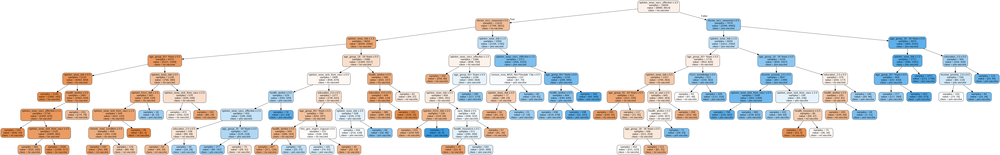

In [0]:
#Visualization
dt = DecisionTreeClassifier(max_depth=8,max_leaf_nodes=60)
dt.fit(X_train,y_train)

from sklearn import tree
from IPython.display import Image  
import pydotplus
thestring = tree.export_graphviz(dt, out_file=None,  
                         feature_names=X_train.columns.values, 
                         class_names=['no vaccine','yes vaccine'],  
                         filled=True, rounded=True,  
                         special_characters=True,impurity=False)
graph = pydotplus.graph_from_dot_data(thestring)  
Image(graph.create_png())  

In [0]:
#Feature importance (Gini importance, top 10)
pd.DataFrame({"importance":dt.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:20]

,importance
opinion_seas_vacc_effective,0.325983
doctor_recc_seasonal,0.191027
opinion_seas_risk,0.141806
age_group_65+ Years,0.059494
opinion_seas_sick_from_vacc,0.033568
age_group_18 - 34 Years,0.032102
health_worker,0.023440
education_2.0,0.014492
opinion_h1n1_risk,0.010386
h1n1_knowledge,0.009675


In [0]:
#GridSeach to optimize parameter
from sklearn.ensemble import RandomForestClassifier
param_grid ={"max_depth":[x for x in range(1,10,1)]} 

fr = RandomForestClassifier(n_estimators=100)
gr = GridSearchCV(fr,param_grid=param_grid,cv=5)
rs=gr.fit(X_train,y_train) 

#Show best parameter and accuracy
print ('Best parameter value:',rs.best_params_)
y_predict = rs.predict(X_test)
print ('Accuracy = ',((y_predict == y_test).value_counts(normalize=True)[True]))

Best parameter value: {'max_depth': 9}
Accuracy =  0.7808561088231624


In [0]:
#Feature Importance (Gini importance)
rf = RandomForestClassifier(n_estimators=100,max_depth=9)
rf.fit(X_train,y_train)

pd.DataFrame({"importance":rf.feature_importances_},index=X_train.columns).sort_values(by=["importance"],ascending=False)[:20]

,importance
opinion_seas_risk,0.186579
opinion_seas_vacc_effective,0.175723
doctor_recc_seasonal,0.153577
age_group_65+ Years,0.067198
opinion_h1n1_risk,0.036036
age_group_18 - 34 Years,0.031790
opinion_h1n1_vacc_effective,0.028045
doctor_recc_h1n1,0.027750
opinion_seas_sick_from_vacc,0.022511
health_worker,0.017145


#Bayesian Networks - Not Used

In [0]:
!pip install pgmpy

     |████████████████████████████████| 348kB 3.4MB/s 


In [0]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
#list of categorical variables
cat_cols = joined_df.columns
#This function will encode non-null data and replace it in the original data
def ordinalencode(train):
  nonulls = np.array(data.dropna())
  impute_reshape = nonulls.reshape(-1,1)
  impute_ordinal = encoder.fit_transform(impute_reshape)
  data.loc[data.notnull()] = np.squeeze(impute_ordinal)
  return data
#encoding all the categorical data in the data set through looping
for columns in cat_cols:
  encode(joined_df[columns])

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setit

In [0]:
joined_df.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,3.0,1,3.0,0.0,2,1,0,1,8.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0
1,1.0,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,3.0,3.0,1.0,3.0,1.0,0,3.0,1.0,2,1,1,0,1.0,0.0,0.0,0.0,12,19,0.0,1.0
2,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,2.0,0.0,0.0,3.0,0.0,1.0,0.0,2,3.0,1.0,0,1,0,0,9.0,0.0,2.0,0.0,14,21,0.0,0.0
3,3.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,2.0,2.0,4.0,4.0,3.0,0.0,4.0,0,3.0,0.0,2,1,1,1,5.0,1.0,0.0,0.0,NaN,NaN,0.0,1.0
4,4.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,2.0,2.0,1.0,2.0,0.0,3.0,2.0,3,3.0,0.0,0,0,0,0,9.0,0.0,1.0,0.0,18,5,0.0,0.0


In [0]:
joined_df_bayes = joined_df.loc[:,"h1n1_concern":"household_children"]
joined_df_bayes['h1n1_vaccine'] = joined_df['h1n1_vaccine']
joined_df_bayes['seasonal_vaccine'] = joined_df['seasonal_vaccine']
joined_df_bayes = joined_df_bayes.dropna()
joined_df_bayes.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,3.0,1,3.0,0.0,2,1,0,1,8.0,2.0,0.0,0.0,0.0,0.0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,3.0,3.0,1.0,3.0,1.0,0,3.0,1.0,2,1,1,0,1.0,0.0,0.0,0.0,0.0,1.0
7,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,4.0,1.0,0.0,3.0,1.0,0.0,2.0,3,3.0,0.0,0,0,0,0,1.0,2.0,2.0,0.0,1.0,1.0
9,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,3.0,1.0,1.0,3.0,1.0,1.0,3.0,0,3.0,1.0,0,1,0,1,9.0,0.0,0.0,0.0,0.0,0.0
10,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,3.0,0.0,1.0,4.0,3.0,3.0,2.0,0,3.0,1.0,0,0,1,0,6.0,0.0,2.0,0.0,1.0,1.0


In [0]:
from pgmpy.estimators import HillClimbSearch
from pgmpy.estimators import ExhaustiveSearch
from pgmpy.estimators import K2Score, BicScore, BDeuScore
from pgmpy.models import BayesianModel

hc = HillClimbSearch(joined_df_bayes, scoring_method=BicScore(joined_df_bayes))
best_model = BayesianModel(hc.estimate().edges()) # convert DAG to BayesianModel
print(best_model.edges())

[('h1n1_concern', 'behavioral_avoidance'), ('h1n1_concern', 'behavioral_large_gatherings'), ('h1n1_concern', 'behavioral_touch_face'), ('h1n1_concern', 'behavioral_wash_hands'), ('h1n1_concern', 'behavioral_face_mask'), ('behavioral_avoidance', 'behavioral_touch_face'), ('behavioral_avoidance', 'behavioral_wash_hands'), ('behavioral_avoidance', 'behavioral_large_gatherings'), ('behavioral_large_gatherings', 'behavioral_outside_home'), ('behavioral_large_gatherings', 'behavioral_face_mask'), ('behavioral_touch_face', 'behavioral_wash_hands'), ('behavioral_touch_face', 'behavioral_large_gatherings'), ('behavioral_touch_face', 'sex'), ('behavioral_touch_face', 'behavioral_outside_home'), ('behavioral_wash_hands', 'sex'), ('behavioral_antiviral_meds', 'behavioral_face_mask'), ('sex', 'health_worker'), ('sex', 'employment_status'), ('sex', 'age_group'), ('sex', 'household_adults'), ('behavioral_outside_home', 'education'), ('behavioral_outside_home', 'behavioral_antiviral_meds'), ('educatio

In [0]:
#Estimating and visualising the CPDs
from pgmpy.estimators import BayesianEstimator

best_model.fit(joined_df_bayes, estimator=BayesianEstimator, prior_type='K2')
for cpd in best_model.get_cpds():
    print("CPD of {variable}:".format(variable=cpd.variable))
    print(cpd)
print (best_model.local_independencies(best_model.nodes()))

CPD of h1n1_concern:
+-----------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+
| opinion_h1n1_risk           | opinion_h1n1_risk(0.0)           | opini

TypeError: ignored

In [0]:
for thenode in best_model.nodes():
    print(best_model.local_independencies(thenode))

(h1n1_concern _|_ opinion_seas_sick_from_vacc, opinion_seas_risk | opinion_h1n1_sick_from_vacc, opinion_h1n1_risk)
(behavioral_avoidance _|_ opinion_h1n1_sick_from_vacc, opinion_seas_sick_from_vacc, opinion_h1n1_risk, opinion_seas_risk | h1n1_concern)
(behavioral_large_gatherings _|_ opinion_h1n1_vacc_effective, doctor_recc_seasonal, opinion_seas_risk, opinion_seas_vacc_effective, health_insurance, household_children, sex, race, opinion_h1n1_risk, age_group, h1n1_vaccine, opinion_h1n1_sick_from_vacc, marital_status, doctor_recc_h1n1, employment_status, chronic_med_condition, census_msa, opinion_seas_sick_from_vacc, health_worker, seasonal_vaccine, hhs_geo_region, rent_or_own, household_adults, behavioral_wash_hands, child_under_6_months | behavioral_avoidance, behavioral_touch_face, h1n1_concern, income_poverty)
(behavioral_touch_face _|_ opinion_h1n1_sick_from_vacc, opinion_seas_sick_from_vacc, opinion_h1n1_risk, opinion_seas_risk | behavioral_avoidance, h1n1_concern)
(behavioral_wash

In [0]:
train,test=train_test_split(joined_df_bayes,random_state=999,test_size=0.33)

from pgmpy.inference import VariableElimination
from collections import defaultdict
def temp_predict(model,data):
    missing_variables = list(set(model.nodes()) - set(data.columns))
    pred_values = defaultdict(list)
    model_inference = VariableElimination(model)
    
    for index, data_point in data.iterrows():
        states_dict = model_inference.map_query(variables=missing_variables, evidence=data_point.astype(int).to_dict())
        for k, v in states_dict.items():
            pred_values[k].append(v)
    return pd.DataFrame(pred_values, index=data.index)

train_x = train.loc[:,"h1n1_concern":"household_children"]
train_x['seasonal_vaccine'] = joined_df_bayes['seasonal_vaccine']
#predicted_train = best_model.predict(train_x) should work, but is buggy in the current version
predicted_train = temp_predict(best_model, train_x)
print("In sample:",(train.loc[:,'h1n1_vaccine']==predicted_train['h1n1_vaccine']).mean())

test_x = test.loc[:,"h1n1_concern":"household_children"]
test_x['seasonal_vaccine'] = joined_df_bayes['seasonal_vaccine']
#predicted_test = best_model.predict(test_x) should work, but is buggy in the current version
predicted_test = temp_predict(best_model, test_x)
print("Out of sample:",(test.loc[:,'h1n1_vaccine']==predicted_test['h1n1_vaccine']).mean())

Streaming output truncated to the last 5000 lines.
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0i

In sample: 0.8396405518288824


Streaming output truncated to the last 5000 lines.
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0i

Out of sample: 0.8420241459029026


In [0]:
bayes_cols = ['doctor_recc_h1n1','chronic_med_condition','child_under_6_months','health_worker','opinion_h1n1_vacc_effective',
              'opinion_h1n1_risk','age_group','education','race','sex','income_poverty','employment_status','hhs_geo_region',
              'census_msa','household_children','household_adults','opinion_h1n1_sick_from_vacc','doctor_recc_seasonal','opinion_seas_vacc_effective',
              'h1n1_vaccine','seasonal_vaccine']

bayes_dat = joined_df_bayes.loc[:,bayes_cols]

from pgmpy.estimators import HillClimbSearch
from pgmpy.estimators import ExhaustiveSearch
from pgmpy.estimators import K2Score, BicScore, BDeuScore
from pgmpy.models import BayesianModel

hc = HillClimbSearch(bayes_dat, scoring_method=BicScore(bayes_dat))
best_model = BayesianModel(hc.estimate().edges()) # convert DAG to BayesianModel
print(best_model.edges())

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


[('doctor_recc_h1n1', 'h1n1_vaccine'), ('doctor_recc_h1n1', 'child_under_6_months'), ('doctor_recc_h1n1', 'doctor_recc_seasonal'), ('h1n1_vaccine', 'opinion_h1n1_risk'), ('h1n1_vaccine', 'health_worker'), ('h1n1_vaccine', 'doctor_recc_seasonal'), ('doctor_recc_seasonal', 'chronic_med_condition'), ('chronic_med_condition', 'employment_status'), ('employment_status', 'income_poverty'), ('employment_status', 'health_worker'), ('employment_status', 'sex'), ('health_worker', 'education'), ('opinion_h1n1_vacc_effective', 'opinion_seas_vacc_effective'), ('opinion_h1n1_vacc_effective', 'opinion_h1n1_risk'), ('opinion_h1n1_vacc_effective', 'h1n1_vaccine'), ('opinion_h1n1_vacc_effective', 'doctor_recc_h1n1'), ('opinion_seas_vacc_effective', 'seasonal_vaccine'), ('opinion_h1n1_risk', 'opinion_h1n1_sick_from_vacc'), ('opinion_h1n1_risk', 'age_group'), ('age_group', 'household_children'), ('age_group', 'employment_status'), ('age_group', 'household_adults'), ('age_group', 'chronic_med_condition'), 

In [0]:
#Estimating and visualising the CPDs
from pgmpy.estimators import BayesianEstimator

best_model.fit(bayes_dat, estimator=BayesianEstimator, prior_type='K2')
for cpd in best_model.get_cpds():
    print("CPD of {variable}:".format(variable=cpd.variable))
    print(cpd)
print (best_model.local_independencies(best_model.nodes()))

CPD of doctor_recc_h1n1:
+-----------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+
| opinion_h1n1_vacc_effective | opinion_h1n1_vacc_effective(0.0) | opinion_h1n1_vacc_effective(0.0) | opinion_h1n1_vacc_effective(1.0) | opinion_h1n1_vacc_effective(1.0) | opinion_h1n1_vacc_effective(2.0) | opinion_h1n1_vacc_effective(2.0) | opinion_h1n1_vacc_effective(3.0) | opinion_h1n1_vacc_effective(3.0) | opinion_h1n1_vacc_effective(4.0) | opinion_h1n1_vacc_effective(4.0) |
+-----------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+----------------------------------+-----

TypeError: ignored

In [0]:
for thenode in best_model.nodes():
    print(best_model.local_independencies(thenode))

(doctor_recc_h1n1 _|_ opinion_seas_vacc_effective | seasonal_vaccine, opinion_h1n1_vacc_effective)
(h1n1_vaccine _|_ opinion_seas_vacc_effective | seasonal_vaccine, opinion_h1n1_vacc_effective, doctor_recc_h1n1)
(child_under_6_months _|_ sex, h1n1_vaccine, employment_status, age_group, income_poverty, household_adults, opinion_h1n1_risk, hhs_geo_region, opinion_h1n1_vacc_effective, race, doctor_recc_seasonal, opinion_seas_vacc_effective, education, census_msa, opinion_h1n1_sick_from_vacc, seasonal_vaccine, health_worker, chronic_med_condition | household_children, doctor_recc_h1n1)
(doctor_recc_seasonal _|_ child_under_6_months, opinion_h1n1_vacc_effective, opinion_seas_vacc_effective, age_group, household_adults, opinion_h1n1_sick_from_vacc, household_children, opinion_h1n1_risk | h1n1_vaccine, seasonal_vaccine, doctor_recc_h1n1)
(chronic_med_condition _|_ child_under_6_months, opinion_h1n1_vacc_effective, h1n1_vaccine, opinion_seas_vacc_effective, doctor_recc_h1n1, household_adults, 

In [0]:
bayes_dat

,doctor_recc_h1n1,chronic_med_condition,child_under_6_months,health_worker,opinion_h1n1_vacc_effective,opinion_h1n1_risk,age_group,education,race,sex,income_poverty,employment_status,hhs_geo_region,census_msa,household_children,household_adults,opinion_h1n1_sick_from_vacc,doctor_recc_seasonal,opinion_seas_vacc_effective,h1n1_vaccine,seasonal_vaccine
0,0.0,0.0,0.0,0.0,2.0,0.0,3.0,1,3.0,0.0,2,1,8.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,0.0,0.0,0.0,0.0,4.0,3.0,1.0,0,3.0,1.0,2,0,1.0,0.0,0.0,0.0,3.0,0.0,3.0,0.0,1.0
7,1.0,1.0,0.0,0.0,4.0,1.0,2.0,3,3.0,0.0,0,0,1.0,2.0,0.0,2.0,0.0,0.0,3.0,1.0,1.0
9,0.0,1.0,0.0,0.0,3.0,1.0,3.0,0,3.0,1.0,0,1,9.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0
10,0.0,1.0,1.0,0.0,3.0,0.0,2.0,0,3.0,1.0,0,0,6.0,0.0,0.0,2.0,1.0,0.0,4.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26697,1.0,0.0,0.0,0.0,3.0,1.0,4.0,2,3.0,1.0,1,1,4.0,1.0,0.0,1.0,1.0,1.0,3.0,0.0,0.0
26699,0.0,0.0,0.0,0.0,4.0,0.0,2.0,3,3.0,0.0,0,0,9.0,0.0,0.0,1.0,4.0,0.0,4.0,0.0,0.0
26701,0.0,0.0,1.0,0.0,3.0,1.0,0.0,2,3.0,0.0,1,1,3.0,1.0,0.0,3.0,3.0,0.0,3.0,0.0,0.0
26703,1.0,0.0,0.0,1.0,3.0,1.0,0.0,2,3.0,1.0,0,0,6.0,1.0,0.0,1.0,1.0,1.0,4.0,0.0,0.0


In [0]:
from sklearn.model_selection import train_test_split

In [0]:
train,test=train_test_split(bayes_dat,random_state=999,test_size=0.33)

from pgmpy.inference import VariableElimination
from collections import defaultdict
def temp_predict(model,data):
    missing_variables = list(set(model.nodes()) - set(data.columns))
    pred_values = defaultdict(list)
    model_inference = VariableElimination(model)
    
    for index, data_point in data.iterrows():
        states_dict = model_inference.map_query(variables=missing_variables, evidence=data_point.astype(int).to_dict())
        for k, v in states_dict.items():
            pred_values[k].append(v)
    return pd.DataFrame(pred_values, index=data.index)

train_x = train.loc[:,"doctor_recc_h1n1":"opinion_seas_vacc_effective"]
train_x['seasonal_vaccine'] = bayes_dat['seasonal_vaccine']
#predicted_train = best_model.predict(train_x) should work, but is buggy in the current version
predicted_train = temp_predict(best_model, train_x)
print("In sample:",(train.loc[:,'h1n1_vaccine']==predicted_train['h1n1_vaccine']).mean())

test_x = test.loc[:,"doctor_recc_h1n1":"opinion_seas_vacc_effective"]
test_x['seasonal_vaccine'] = joined_df_bayes['seasonal_vaccine']
#predicted_test = best_model.predict(test_x) should work, but is buggy in the current version
predicted_test = temp_predict(best_model, test_x)
print("Out of sample:",(test.loc[:,'h1n1_vaccine']==predicted_test['h1n1_vaccine']).mean())

Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it [00:00, ?it/s]
0it [00:00, ?it/s]
Finding Elimination Order: : : 0it

In [0]:
train,test=train_test_split(bayes_dat,random_state=999,test_size=0.33)

from pgmpy.inference import VariableElimination
from collections import defaultdict
def temp_predict(model,data):
    missing_variables = list(set(model.nodes()) - set(data.columns))
    pred_values = defaultdict(list)
    model_inference = VariableElimination(model)
    
    for index, data_point in data.iterrows():
        states_dict = model_inference.map_query(variables=missing_variables, evidence=data_point.astype(int).to_dict())
        for k, v in states_dict.items():
            pred_values[k].append(v)
    return pd.DataFrame(pred_values, index=data.index)

train_x = train.loc[:,"doctor_recc_h1n1":"opinion_seas_vacc_effective"]
train_x['h1n1_vaccine'] = bayes_dat['h1n1_vaccine']
#predicted_train = best_model.predict(train_x) should work, but is buggy in the current version
predicted_train = temp_predict(best_model, train_x)
print("In sample:",(train.loc[:,'seasonal_vaccine']==predicted_train['seasonal_vaccine']).mean())

test_x = test.loc[:,"doctor_recc_h1n1":"opinion_seas_vacc_effective"]
test_x['seasonal_vaccine'] = joined_df_bayes['seasonal_vaccine']
#predicted_test = best_model.predict(test_x) should work, but is buggy in the current version
predicted_test = temp_predict(best_model, test_x)
print("Out of sample:",(test.loc[:,'seasonal_vaccine']==predicted_test['h1n1_vaccine']).mean())

#EDA after results

In [0]:
def j_plot_cross_tab_chart(col1,col2):
  cross_tab = pd.crosstab(index=joined_df_1[col1], columns=joined_df_1[col2])
  cross_tab.plot(kind="bar", figsize=(8,8),stacked=True)

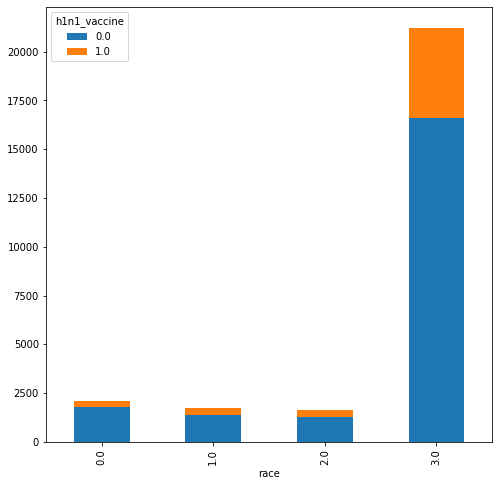

In [0]:
j_plot_cross_tab_chart('race','h1n1_vaccine')

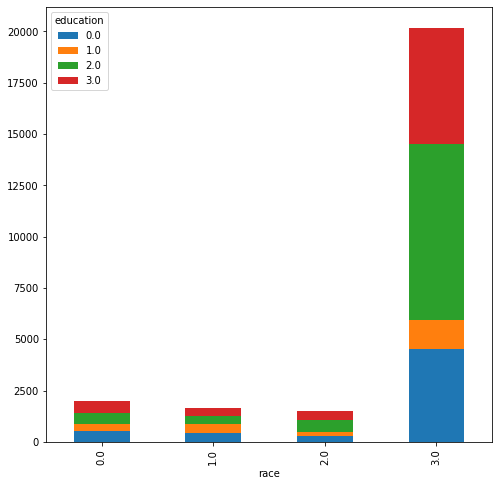

In [0]:
j_plot_cross_tab_chart('race','education')

In [0]:
joined_df

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0,1.0,1.0,0.0,1.0,3.0,1,3.0,0.0,2,1,0,1,8.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0
1,1.0,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,3.0,3.0,1.0,3.0,1.0,0,3.0,1.0,2,1,1,0,1.0,0.0,0.0,0.0,12,19,0.0,1.0
2,2.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,2.0,0.0,0.0,3.0,0.0,1.0,0.0,2,3.0,1.0,0,1,0,0,9.0,0.0,2.0,0.0,14,21,0.0,0.0
3,3.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,2.0,2.0,4.0,4.0,3.0,0.0,4.0,0,3.0,0.0,2,1,1,1,5.0,1.0,0.0,0.0,NaN,NaN,0.0,1.0
4,4.0,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,2.0,2.0,1.0,2.0,0.0,3.0,2.0,3,3.0,0.0,0,0,0,0,9.0,0.0,1.0,0.0,18,5,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702.0,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,2.0,0.0,0.0,4.0,1.0,1.0,4.0,3,3.0,0.0,0,1,0,1,9.0,2.0,0.0,0.0,NaN,NaN,0.0,0.0
26703,26703.0,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,3.0,1.0,1.0,4.0,0.0,0.0,0.0,2,3.0,1.0,0,1,1,0,6.0,1.0,1.0,0.0,4,2,0.0,0.0
26704,26704.0,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,1.0,4.0,3.0,1.0,3.0,3,3.0,0.0,NaN,1,0,NaN,6.0,0.0,0.0,0.0,NaN,NaN,0.0,1.0
26705,26705.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,3,1.0,0.0,0,0,1,0,5.0,2.0,1.0,0.0,4,6,0.0,0.0


In [0]:
data1 = pd.read_csv('https://s3.amazonaws.com/drivendata-prod/data/66/public/training_set_features.csv')

In [0]:
#Combining the train features and labels to visualise vaccine take-up proportions as per features
joined_df_1 = data1.join(trainY, on= data1['respondent_id'],how='left',rsuffix='x_')
joined_df_1 = joined_df_1.drop(columns='respondent_idx_')
print(joined_df_1.shape)
joined_df_1.head()

(26707, 38)


,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [0]:
gdf = joined_df_1.groupby(['race', 'income_poverty']).agg({'h1n1_vaccine': 'sum'})
# Change: groupby state_office and divide by sum
#state_pcts = state_office.groupby(level=0).apply(lambda x:
 #                                                100 * x / float(x.sum()))
gdf

h1n1_vaccine
race              income_poverty                         
Black             <= $75,000, Above Poverty           146
                  > $75,000                            37
                  Below Poverty                        73
Hispanic          <= $75,000, Above Poverty           134
                  > $75,000                            74
                  Below Poverty                        97
Other or Multiple <= $75,000, Above Poverty           139
                  > $75,000                            89
                  Below Poverty                        53
White             <= $75,000, Above Poverty          2180
                  > $75,000                          1523
                  Below Poverty                       293

In [0]:
gdf = joined_df_1.groupby(['race', 'income_poverty']).agg({'seasonal_vaccine': 'sum'})
gdf

seasonal_vaccine
race              income_poverty                             
Black             <= $75,000, Above Poverty               331
                  > $75,000                               108
                  Below Poverty                           154
Hispanic          <= $75,000, Above Poverty               243
                  > $75,000                               118
                  Below Poverty                           135
Other or Multiple <= $75,000, Above Poverty               270
                  > $75,000                               190
                  Below Poverty                            81
White             <= $75,000, Above Poverty              5247
                  > $75,000                              2967
                  Below Poverty                           608

In [0]:
gdf = joined_df_1.groupby(['race', 'income_poverty']).agg({'income_poverty': 'count'})

In [0]:
gdf

income_poverty
race              income_poverty                           
Black             <= $75,000, Above Poverty             931
                  > $75,000                             303
                  Below Poverty                         456
Hispanic          <= $75,000, Above Poverty             679
                  > $75,000                             296
                  Below Poverty                         481
Other or Multiple <= $75,000, Above Poverty             689
                  > $75,000                             376
                  Below Poverty                         247
White             <= $75,000, Above Poverty           10478
                  > $75,000                            5835
                  Below Poverty                        1513

In [0]:
joined_df_1['h1n1_vaccine'].sum()

5674

In [0]:
gdf = joined_df_1.groupby(['race']).agg({'seasonal_vaccine': 'sum'})
gdf

,seasonal_vaccine
race,
Black,741
Hispanic,596
Other or Multiple,677
White,10421


In [0]:
gdf = joined_df_1.groupby(['race']).agg({'h1n1_vaccine': 'sum'})
gdf

,h1n1_vaccine
race,
Black,315
Hispanic,365
Other or Multiple,349
White,4645


In [0]:
joined_df_1

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26702,26702,2.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,1.0,1.0,5.0,2.0,2.0,65+ Years,Some College,White,Female,"<= $75,000, Above Poverty",Not Married,Own,Not in Labor Force,qufhixun,Non-MSA,0.0,0.0,NaN,NaN,0,0
26703,26703,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,2.0,5.0,1.0,1.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Rent,Employed,lzgpxyit,"MSA, Principle City",1.0,0.0,fcxhlnwr,cmhcxjea,0,0
26704,26704,2.0,2.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,4.0,4.0,2.0,5.0,4.0,2.0,55 - 64 Years,Some College,White,Female,NaN,Not Married,Own,NaN,lzgpxyit,"MSA, Not Principle City",0.0,0.0,NaN,NaN,0,1
26705,26705,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,2.0,1.0,2.0,18 - 34 Years,Some College,Hispanic,Female,"<= $75,000, Above Poverty",Married,Rent,Employed,lrircsnp,Non-MSA,1.0,0.0,fcxhlnwr,haliazsg,0,0


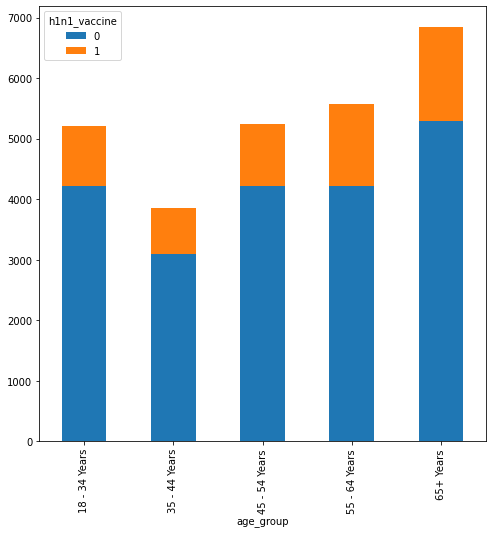

In [0]:
j_plot_cross_tab_chart('age_group','h1n1_vaccine')

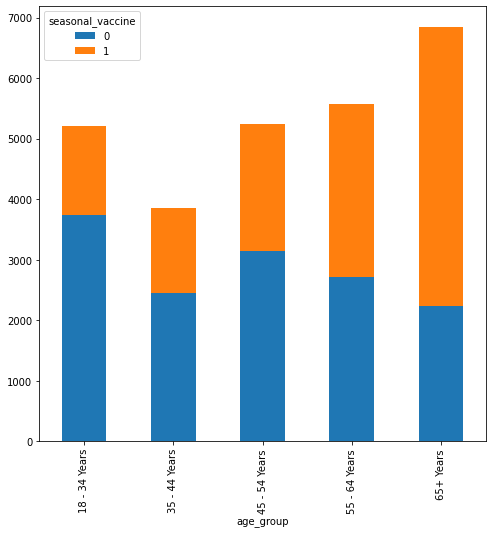

In [0]:
j_plot_cross_tab_chart('age_group','seasonal_vaccine')

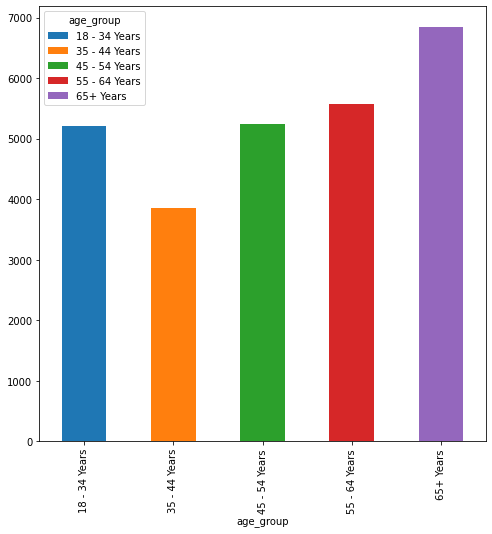

In [0]:
j_plot_cross_tab_chart('age_group','age_group')

In [0]:
gdf = joined_df_1.groupby(['age_group']).agg({'h1n1_vaccine': 'sum'})
# Change: groupby state_office and divide by sum
gdf = gdf.groupby(level=0).apply(lambda x:100 * x / float(len(joined_df_1)))
gdf

,h1n1_vaccine
age_group,
18 - 34 Years,3.710638
35 - 44 Years,2.849440
45 - 54 Years,3.819223
55 - 64 Years,5.058599
65+ Years,5.807466
